# CSE4062 Data Science - Delivery #4

## Göksel Tokur - 150116049

## Arda Bayram-150116029

## Gülnihal Erdem - 150319554

## İrem Seçmen - 170219006

In [1]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [2]:
# Read Data
df = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [3]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

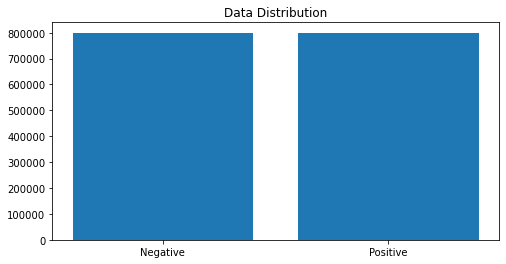

In [4]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [5]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ardab\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

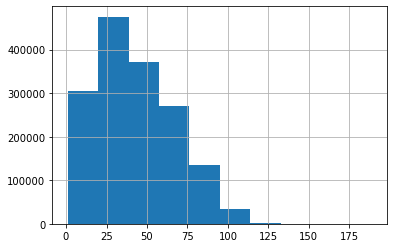

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [7]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [8]:
all_str = ""
for i in df.tweet:
    all_str += i

In [9]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('../data/letter_frequency_en_US.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081238,4687379.0
1,b,975326,0.016904,0.014893,859300.0
2,c,1705409,0.029557,0.027114,1564464.0
3,d,2289515,0.039680,0.043192,2492128.0
4,e,6471295,0.112156,0.120195,6935169.0
5,f,878849,0.015232,0.023039,1329304.0
6,g,2231747,0.038679,0.020257,1168838.0
7,h,2234047,0.038719,0.059215,3416628.0
8,i,3779579,0.065505,0.073054,4215160.0
9,j,143817,0.002493,0.001031,59502.0


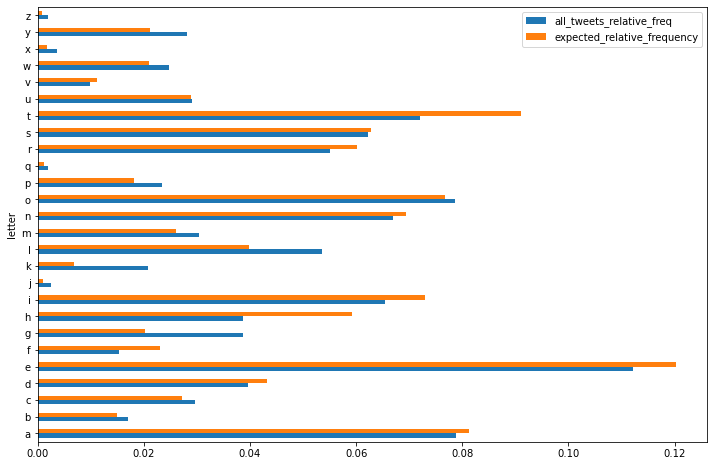

In [10]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [11]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.7%).

In [12]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.967421
expected,0.967421,1.000000


In [13]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [14]:
df1.number_of_characters.max()

189

In [15]:
df1.number_of_characters.min()

1

In [16]:
df1.number_of_characters.mean()

42.7974010379771

In [17]:
df1.number_of_characters.std()

24.15896165070398

## Number of Words

In [18]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [19]:
df1.number_of_words.max()

50

In [20]:
df1.number_of_words.min()

1

In [21]:
df1.number_of_words.mean()

7.244474128445898

In [22]:
df1.number_of_words.std()

4.030421805717334

### Positives + Negatives

<BarContainer object of 20 artists>

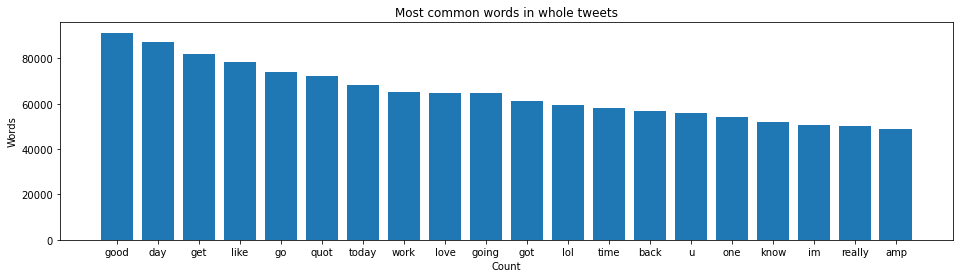

In [23]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

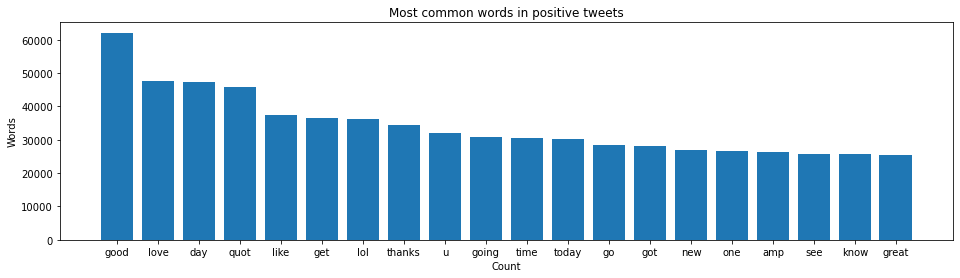

In [24]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

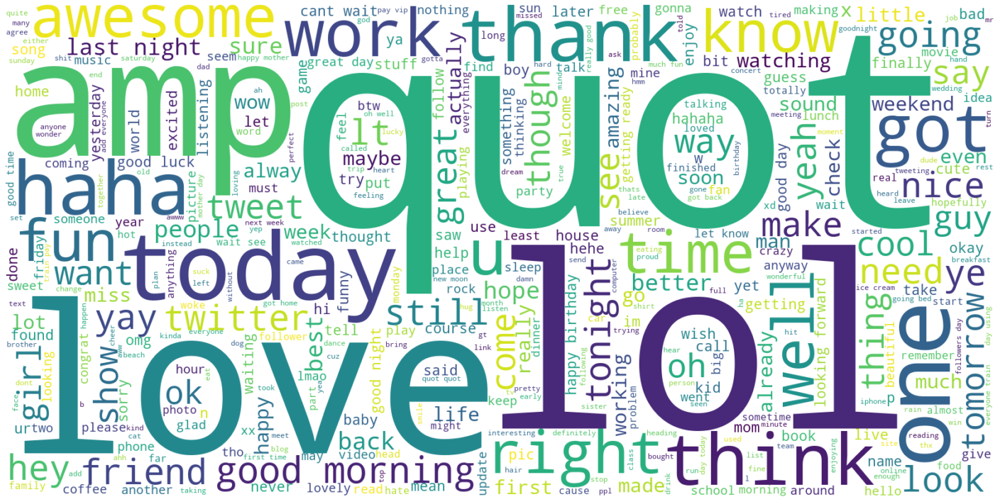

In [25]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

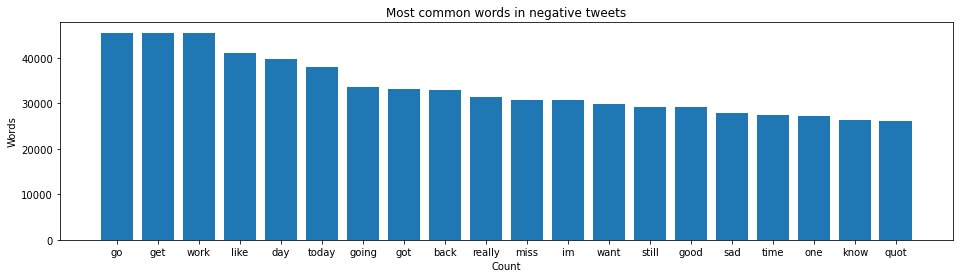

In [26]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

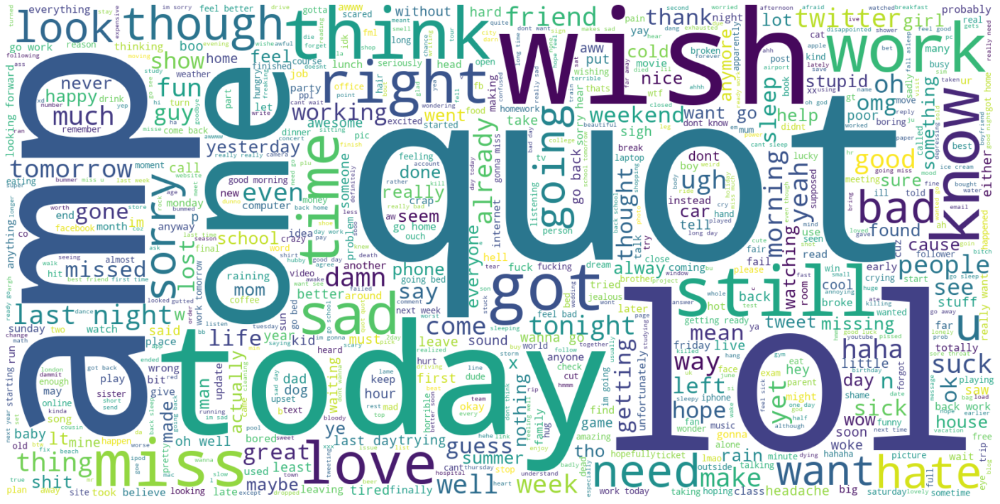

In [27]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [28]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [29]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [30]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Vocabulary Size : 290458


In [31]:
from keras.preprocessing.sequence import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [32]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


### GLOVE Embedding

In [33]:
MODELS_PATH = '../models'
EMBEDDING_DIMENSION = 300

In [34]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('../glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


## Feature Extraction

### Bag of Words

In [35]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(first_K_tweets)

# Dictionary
vectorizer.get_feature_names()

['00',
 '000',
 '0007',
 '000followers',
 '007peter',
 '00am',
 '00ga',
 '00pm',
 '01',
 '02',
 '03',
 '04',
 '05',
 '06',
 '07',
 '08',
 '08am',
 '09',
 '0f',
 '0nce',
 '0r',
 '0s',
 '0va',
 '10',
 '100',
 '1000',
 '1000s',
 '1000v',
 '1001',
 '101',
 '102',
 '103',
 '1030',
 '104',
 '105',
 '106',
 '1081',
 '109',
 '10am',
 '10ish',
 '10k',
 '10klf',
 '10pm',
 '10th',
 '10x',
 '10years',
 '11',
 '110',
 '1101',
 '1130',
 '1130pm',
 '11350',
 '115',
 '119',
 '11am',
 '11k',
 '11pm',
 '11th',
 '12',
 '120',
 '1200',
 '1200km',
 '1250',
 '127',
 '127rupees',
 '12am',
 '12pm',
 '12seconds',
 '13',
 '130',
 '1300',
 '130pm',
 '133',
 '13th',
 '14',
 '140',
 '1408',
 '140conf',
 '140sunday',
 '145',
 '149',
 '14am',
 '14hr',
 '14th',
 '15',
 '150',
 '150k',
 '152',
 '159',
 '15am',
 '15th',
 '16',
 '160',
 '1630',
 '1664',
 '16gb',
 '16th',
 '17',
 '173',
 '17th',
 '18',
 '181',
 '182',
 '184',
 '18mth',
 '18th',
 '19',
 '190',
 '1909',
 '1930',
 '1940',
 '19627',
 '1970',
 '1976',
 '198',

In [36]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [37]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

new blog post feel
[0 0 0 ... 0 0 0]
underweight amp malnourished might well eating disorder
[0 0 0 ... 0 0 0]
ok
[0 0 0 ... 0 0 0]
thought would kb class week
[0 0 0 ... 0 0 0]
sis gt gloriavelez love
[0 0 0 ... 0 0 0]
watched epsidoe 8 9 hills needs watch finale
[0 0 0 ... 0 0 0]
getting ready daughter karate tournament got big day ahead us
[0 0 0 ... 0 0 0]
raining outside bed salad coke peanut amp ms eeepc stationery dsi dvd hard life
[0 0 0 ... 0 0 0]
1000v amp powerpath additional technology costs top enterpriseplus license costs
[0 0 0 ... 0 0 0]
dang dont even make top 50 lame
[0 0 0 ... 0 0 0]
time lunch mutton come back later
[0 0 0 ... 0 0 0]
wish lived vacay
[0 0 0 ... 0 0 0]
better tweeting u morning x
[0 0 0 ... 0 0 0]
okay new quote quot wanna wanna quot like tell texting 850 768 1130 p0k3r f
[0 0 0 ... 0 0 0]
made sad everyone team esspecially table thought could saying
[0 0 0 ... 0 0 0]
always neeeeeed something hot water bottle
[0 0 0 ... 0 0 0]
purr pawpawty
[0 0 0 .

[0 0 0 ... 0 0 0]
bed time cuddling pillows
[0 0 0 ... 0 0 0]
sure
[0 0 0 ... 0 0 0]
top office 119 correct
[0 0 0 ... 0 0 0]
think like attacking like coke creatures grown opens coke great day
[0 0 0 ... 0 0 0]
looking forward finishing work getting girls
[0 0 0 ... 0 0 0]
home hair dresses lovin new look
[0 0 0 ... 0 0 0]
9 years old kids thing one get q
[0 0 0 ... 0 0 0]
jcarcamo lesthermosh turned fine maybe sometimes better jump thanks guys
[0 0 0 ... 0 0 0]
laying sun day
[0 0 0 ... 0 0 0]
right post turns 11 12 llollll
[0 0 0 ... 0 0 0]
watched lakers tonight kobe lost wait see terminator salvation
[0 0 0 ... 0 0 0]
astro mike currently spacewalking astro 127 launch june
[0 0 0 ... 0 0 0]
book quotes beatccr front matter wanna know
[0 0 0 ... 0 0 0]
shit someone sleeping tonight glad enjoying true blood
[0 0 0 ... 0 0 0]
lost anymore
[0 0 0 ... 0 0 0]
soo sad enjoying sun x
[0 0 0 ... 0 0 0]
bubba asleep next precious pup
[0 0 0 ... 0 0 0]
hey hope running hard crazy today
[0 0 

[0 0 0 ... 0 0 0]
saw doctor finish line said stressed ligament amp rest still put weight
[0 0 0 ... 0 0 0]
eeep nice betty go gf
[0 0 0 ... 0 0 0]
thanks link keep next time already ordered glasses
[0 0 0 ... 0 0 0]
thats get alone birds feather flock u know im going wit slighty crew thats name
[0 0 0 ... 0 0 0]
sure miss calling 92520 amp hearing fabulous voice lq01 end saying quot people pray quot newbies boring
[0 0 0 ... 0 0 0]
best night ever talk
[0 0 0 ... 0 0 0]
lol nag much least seeing star trek wish jb lol
[0 0 0 ... 0 0 0]
well lunch time finally halfway shift
[0 0 0 ... 0 0 0]
watched willly wonka
[0 0 0 ... 0 0 0]
apparently waiting fuel truck 20 mins
[0 0 0 ... 0 0 0]
check blogspot find surprise
[0 0 0 ... 0 0 0]
shooting video new song today persons college thing using one new songs x
[0 0 0 ... 0 0 0]
look twitter expert posting tr im links everything spelled correctly
[0 0 0 ... 0 0 0]
truthfully two terms work quot newbie quot quot uber quot go figure
[0 0 0 ... 0 

[0 0 0 ... 0 0 0]
happy father day sadly mine celebrating
[0 0 0 ... 0 0 0]
going hme start getting ready 4 wrk wish could relax n chill day happening haha
[0 0 0 ... 0 0 0]
brand new car
[0 0 0 ... 0 0 0]
says good night everyone forget visit blog
[0 0 0 ... 0 0 0]
early conference call
[0 0 0 ... 0 0 0]
lorraine irish accent come go wannabe twitprentice apprentice
[0 0 0 ... 0 0 0]
really idea regions
[0 0 0 ... 0 0 0]
saw facebook aunt works across road place
[0 0 0 ... 0 0 0]
stand men sometimes
[0 0 0 ... 0 0 0]
b day tomorrow whieewh
[0 0 0 ... 0 0 0]
sims 3 working
[0 0 0 ... 0 0 0]
im trying study get ellen show want come visit guys us
[0 0 0 ... 0 0 0]
psst go look
[0 0 0 ... 0 0 0]
hungry day bad prom bod
[0 0 0 ... 0 0 0]
ugh mad bc craving chinese gave lol
[0 0 0 ... 0 0 0]
woohoo feel like arseee feels baddd good side sleep mine exacly ten minutes
[0 0 0 ... 0 0 0]
hey going
[0 0 0 ... 0 0 0]
try 2 enjoy looking quot w end quot job yesss hafta link soon
[0 0 0 ... 0 0 0]
c

[0 0 0 ... 0 0 0]
finished watching jurassic park hellboy 2 golden army
[0 0 0 ... 0 0 0]
heading work leave stuff myspace 4 comign today things like quot
[0 0 0 ... 0 0 0]
relationships r really complicated knw nuthin stable many crossroads ahead seems never gona b smooth
[0 0 0 ... 0 0 0]
hate waking middle night able fall back asleep
[0 0 0 ... 0 0 0]
welcome chris
[0 0 0 ... 0 0 0]
shout famousbarbiekei using fake pictures internet
[0 0 0 ... 0 0 0]
low blood pressure almost ruined looot fun today
[0 0 0 ... 0 0 0]
lol frankierue last night woooooooooow horrible
[0 0 0 ... 0 0 0]
second
[0 0 0 ... 0 0 0]
dinner ready
[0 0 0 ... 0 0 0]
hahahaaa right tell thabizness bring lol jamesofctpmag lol u chimin n
[0 0 0 ... 0 0 0]
goal get 500 updates school monday back hurts
[0 0 0 ... 0 0 0]
chow mein noodles w shrimp
[0 0 0 ... 0 0 0]
awesome missed flight houston theyre sold till midday tomorrow looks like might going austin driving
[0 0 0 ... 0 0 0]
hmmm maybe lovely dragonfly
[0 0 0 ..

[0 0 0 ... 0 0 0]
haha took life got dishes level 10 barely play anymore
[0 0 0 ... 0 0 0]
hehe okayy ton people xd lets hang soon
[0 0 0 ... 0 0 0]
watching titanic
[0 0 0 ... 0 0 0]
rarely talk tho twitter friendship wit u lol
[0 0 0 ... 0 0 0]
yea haha kay going sleep
[0 0 0 ... 0 0 0]
audio recording
[0 0 0 ... 0 0 0]
im ready anytime want
[0 0 0 ... 0 0 0]
finally desk phone allowed register thank
[0 0 0 ... 0 0 0]
u positive xx
[0 0 0 ... 0 0 0]
famous macupdate promo back shame apps never seem fit particular needs
[0 0 0 ... 0 0 0]
feeel like shittt
[0 0 0 ... 0 0 0]
haha im struggling get extra digit end score
[0 0 0 ... 0 0 0]
seriously start morning ryan leslie ears im noticing digg
[0 0 0 ... 0 0 0]
aw missin hollywood sparkles toi eating panang im want tom kha kai bad
[0 0 0 ... 0 0 0]
lol miami film festival la miss goin serious withdrawl
[0 0 0 ... 0 0 0]
beautiful pic thank sharing us everything everything see awes
[0 0 0 ... 0 0 0]
need long drive even driver passenger 

[0 0 0 ... 0 0 0]
hungry let go get bueno marriage wait food
[0 0 0 ... 0 0 0]
tomorrow driving west side glacier np exploring heading towards spokane wa travels end sunday
[0 0 0 ... 0 0 0]
awww thats horrible cathays cardiff like safest place ever hope okay x
[0 0 0 ... 0 0 0]
aww tell said good miss ya
[0 0 0 ... 0 0 0]
go anymore go hospital
[0 0 0 ... 0 0 0]
yes
[0 0 0 ... 0 0 0]
yep palma literally disappeared view office window hate say think coming way
[0 0 0 ... 0 0 0]
found one hand held fans kitchen mine lights well best moment life
[0 0 0 ... 0 0 0]
good plan
[0 0 0 ... 0 0 0]
sleeping 9 hours race
[0 0 0 ... 0 0 0]
okay changed mind like features bing web results still irrelevant live search
[0 0 0 ... 0 0 0]
grr tattoo itches cant touch coz new
[0 0 0 ... 0 0 0]
dad diabetic song close heart lines vines trying times choose love entire album kk done
[0 0 0 ... 0 0 0]
early start today bright sunny day downtown bristol lots traffic noise seems rush hour starts 5am
[0 0 0 ..

[0 0 0 ... 0 0 0]
yup still packing still crossing things lists still lot believe finally leaving tomorrow
[0 0 0 ... 0 0 0]
til july 2 depending hotel sometimes get free internet
[0 0 0 ... 0 0 0]
loves house
[0 0 0 ... 0 0 0]
zero activity new picture like even views lost mojo despair
[0 0 0 ... 0 0 0]
damn thought game came today misread espn
[0 0 0 ... 0 0 0]
haha lol good thing tell parents already crush might regreting end haha
[0 0 0 ... 0 0 0]
think lost friend least one last good days remember
[0 0 0 ... 0 0 0]
nothing better morning cuddles
[0 0 0 ... 0 0 0]
mmm bacon eggs plus toast jam brekkies ignore pain get work
[0 0 0 ... 0 0 0]
twin keep secret
[0 0 0 ... 0 0 0]
stupid throat colonial today
[0 0 0 ... 0 0 0]
know better place still hard know gone love u
[0 0 0 ... 0 0 0]
family guy silly
[0 0 0 ... 0 0 0]
yes video made sad
[0 0 0 ... 0 0 0]
thank u construction content updated pure hotness story u
[0 0 0 ... 0 0 0]
backyard parties free food
[0 0 0 ... 0 0 0]
rainy da

painting toe nailz getting ready tomorrow mention love shit myparajaws extra today
[0 0 0 ... 0 0 0]
omg sooo excited even go back sleep hope baby today
[0 0 0 ... 0 0 0]
find phone
[0 0 0 ... 0 0 0]
going madies house
[0 0 0 ... 0 0 0]
put right hurt like bitchhhh feel like crying hahahha
[0 0 0 ... 0 0 0]
w caro amp alex watching c season 3 glorious
[0 0 0 ... 0 0 0]
either evidence listening customers acting
[0 0 0 ... 0 0 0]
get 100 followers day using www tweeteradder com add everyone train pay vip
[0 0 0 ... 0 0 0]
classes summer long
[0 0 0 ... 0 0 0]
noo oi want one old friend use n use every weekend uhh want 1
[0 0 0 ... 0 0 0]
open
[0 0 0 ... 0 0 0]
listening therealsavannah radio disney
[0 0 0 ... 0 0 0]
still
[0 0 0 ... 0 0 0]
lol yeah imagine
[0 0 0 ... 0 0 0]
seriously hope swine flu get well soon gt lt
[0 0 0 ... 0 0 0]
cos got headbuttd crashed tv im better
[0 0 0 ... 0 0 0]
ihate dude snores like truck acts like wrong kicking sleep
[0 0 0 ... 0 0 0]
finish luncch hehe 

cant belive people would make fun
[0 0 0 ... 0 0 0]
english
[0 0 0 ... 0 0 0]
fun dont go crazy say hi elisa already miss
[0 0 0 ... 0 0 0]
anthonysssss twisted fahs
[0 0 0 ... 0 0 0]
buy itunes voucher get 3 0 comes
[0 0 0 ... 0 0 0]
poor boy coughing fever feel sorry lil ones sick always want mommies
[0 0 0 ... 0 0 0]
babysitting lonf time dont hate kids stay later want oh well geet itt
[0 0 0 ... 0 0 0]
ur gng 2 new york h8 u much
[0 0 0 ... 0 0 0]
mija want see youuu
[0 0 0 ... 0 0 0]
huge win epic win love bruins happy lt 3 thanks great saturday guys via magicmittens
[0 0 0 ... 0 0 0]
4 sons 3 old enough play games fan game play 360
[0 0 0 ... 0 0 0]
ordered zach galifianakis sunglasses hangover sold july 7th
[0 0 0 ... 0 0 0]
cant believe miley jb concert texas hate
[0 0 0 ... 0 0 0]
time together though always great thing
[0 0 0 ... 0 0 0]
bright amp early justin coming little lazy sunday
[0 0 0 ... 0 0 0]
sitting traffic exit half mile away movig anywhere
[0 0 0 ... 0 0 0]
post

[0 0 0 ... 0 0 0]
writing letters world vision children written sponsored children
[0 0 0 ... 0 0 0]
idiot diagram 6 x8 cutting lines work 4 x8 boards
[0 0 0 ... 0 0 0]
summer rocks
[0 0 0 ... 0 0 0]
found site migrate new server back tuesday
[0 0 0 ... 0 0 0]
hehe careful u become analytics nut u install
[0 0 0 ... 0 0 0]
fun seeing hangover probably funniest movie ever seen
[0 0 0 ... 0 0 0]
headed day thomas train
[0 0 0 ... 0 0 0]
maybe get 2 people like content 2 nerdy 4 crowd guess
[0 0 0 ... 0 0 0]
oh btm chaos
[0 0 0 ... 0 0 0]
good afternoon buddy
[0 0 0 ... 0 0 0]
trouble boyf
[0 0 0 ... 0 0 0]
home school due sore back
[0 0 0 ... 0 0 0]
get really bad insomnia summer break
[0 0 0 ... 0 0 0]
tink awwwww crap good morning
[0 0 0 ... 0 0 0]
oh im happy felt like
[0 0 0 ... 0 0 0]
soulfulgroover linz 82 thank much coming appreciate support unfortunately pass final
[0 0 0 ... 0 0 0]
using new desk ok wife new desk nice place use compy couch
[0 0 0 ... 0 0 0]
generally phones wate

sleepin andrea house
[0 0 0 ... 0 0 0]
noo got mexican food cooled lol velvet
[0 0 0 ... 0 0 0]
supply store base water flooded 2 inches high im soaked
[0 0 0 ... 0 0 0]
hmm nice ok still looking one
[0 0 0 ... 0 0 0]
hey maddy
[0 0 0 ... 0 0 0]
x men origins looks cool follow people
[0 0 0 ... 0 0 0]
waiting quit smoking coach call
[0 0 0 ... 0 0 0]
want get bed good nights sleep
[0 0 0 ... 0 0 0]
twitter messed even screwed account follow
[0 0 0 ... 0 0 0]
hello new follwer breakfast sounds lovely amp yes probably taste even better peace ad quiet called norfolk
[0 0 0 ... 0 0 0]
reply
[0 0 0 ... 0 0 0]
feel pretty lonely hitting outback alone
[0 0 0 ... 0 0 0]
thank hon lt 3 enjoying new home today
[0 0 0 ... 0 0 0]
looks like summer finally
[0 0 0 ... 0 0 0]
yeah think right
[0 0 0 ... 0 0 0]
today shrek birthday love happy b day shrek
[0 0 0 ... 0 0 0]
btw think still stuck month may
[0 0 0 ... 0 0 0]
getting ready take lil man doc croupy cough good
[0 0 0 ... 0 0 0]
dreading time 

[0 0 0 ... 0 0 0]
musta forgot king 2k9 last times played left wit w left wit frown lt like
[0 0 0 ... 0 0 0]
thanks
[0 0 0 ... 0 0 0]
follow
[0 0 0 ... 0 0 0]
sorry make hoping work
[0 0 0 ... 0 0 0]
aw sorry hear hope nothing serious
[0 0 0 ... 0 0 0]
bouquets personal flowers way bride editing photos viewing pleasure
[0 0 0 ... 0 0 0]
little mistake
[0 0 0 ... 0 0 0]
loves mom gives im kisses
[0 0 0 ... 0 0 0]
tons stuff also enjoyed ski lift goes mountains lots fun
[0 0 0 ... 0 0 0]
back france amazing
[0 0 0 ... 0 0 0]
mrbrucewayne oh snap nice sunny day london city yo gonna fun today rdj day
[0 0 0 ... 0 0 0]
thankd followfriday
[0 0 0 ... 0 0 0]
suddenly eyes getting dry tired time sleep wish 3rd sister happy birthday everyday happy day
[0 0 0 ... 0 0 0]
haha back guests view nice try
[0 0 0 ... 0 0 0]
ur couch charge hr
[0 0 0 ... 0 0 0]
congrats signing lease shabby
[0 0 0 ... 0 0 0]
cant sleep right fell asleep like 1030 amp woke wide awake
[0 0 0 ... 0 0 0]
10 31 pm welcomed

[0 0 0 ... 0 0 0]
even walk
[0 0 0 ... 0 0 0]
gonna need assistant pretty soon
[0 0 0 ... 0 0 0]
really enjoying lonely night tonight
[0 0 0 ... 0 0 0]
im back school gosh whut day
[0 0 0 ... 0 0 0]
awww derek work back making kandie little ones
[0 0 0 ... 0 0 0]
wishing one day time always goes way fast
[0 0 0 ... 0 0 0]
leaving work ready weekend tonight camping beach bf family
[0 0 0 ... 0 0 0]
walk rundle hate 18 city
[0 0 0 ... 0 0 0]
think going go hibernation football season starts way time go faster
[0 0 0 ... 0 0 0]
lol iam sorry boobee b like dat
[0 0 0 ... 0 0 0]
mmmm mom made green curry dinnertime
[0 0 0 ... 0 0 0]
wow really sucks sad see happens believed way
[0 0 0 ... 0 0 0]
hold cell phone friend
[0 0 0 ... 0 0 0]
youre trying
[0 0 0 ... 0 0 0]
tired get home 1am
[0 0 0 ... 0 0 0]
like disappointed
[0 0 0 ... 0 0 0]
back work today
[0 0 0 ... 0 0 0]
thank u 4 telling u pretty cool w jetting la next fri b c r wrk hitting casino
[0 0 0 ... 0 0 0]
happy chicken paprikash 

[0 0 0 ... 0 0 0]
6 days
[0 0 0 ... 0 0 0]
want promote division 5 eat us alive
[0 0 0 ... 0 0 0]
cool neil gaiman reading graveyard book
[0 0 0 ... 0 0 0]
new attitude
[0 0 0 ... 0 0 0]
juz sticked 2 salonpas back waist cooling
[0 0 0 ... 0 0 0]
argh early night got addicted writing thins new song lyrics everything
[0 0 0 ... 0 0 0]
ouch ice jazz fingers worry show awesome regardless 2 burnt thumbs
[0 0 0 ... 0 0 0]
giant magic flakes box magical anymore suspect air leak
[0 0 0 ... 0 0 0]
thanks surely two finger crossings better one
[0 0 0 ... 0 0 0]
thank giselle love quote
[0 0 0 ... 0 0 0]
finally watch pilot
[0 0 0 ... 0 0 0]
www dnes bg redisigned new design definitely sucks
[0 0 0 ... 0 0 0]
working weekend
[0 0 0 ... 0 0 0]
well hello new addition twitter fam sorry extra late response phone took nap lol
[0 0 0 ... 0 0 0]
want go sway sway baby clip dont think mummy let
[0 0 0 ... 0 0 0]
haha secret
[0 0 0 ... 0 0 0]
us us
[0 0 0 ... 0 0 0]
oh whyyy
[0 0 0 ... 0 0 0]
hahaha put

[0 0 0 ... 0 0 0]
awww thanxx amp ima try amp yup yu rite
[0 0 0 ... 0 0 0]
hey inspiration writing fiction got five pages last night
[0 0 0 ... 0 0 0]
boy kill boy hey dude missxmarisa stabbed today ok hospital
[0 0 0 ... 0 0 0]
everyone rainy day safe n stay dry hehe jus got home grocery shopping
[0 0 0 ... 0 0 0]
omg team jacob
[0 0 0 ... 0 0 0]
good morning time get
[0 0 0 ... 0 0 0]
come canada please l u message back sooooo happy
[0 0 0 ... 0 0 0]
slowly realizing fact momz moving europe join dad tmrw living alone getting abit sad
[0 0 0 ... 0 0 0]
lose nicked first week
[0 0 0 ... 0 0 0]
excited get hear miguel ruiz agape morning tweeting life hour
[0 0 0 ... 0 0 0]
fun getting chores done nice cool day think
[0 0 0 ... 0 0 0]
yeah love little kids nothing makes sad tragic stories like
[0 0 0 ... 0 0 0]
good morning myfacetwitter
[0 0 0 ... 0 0 0]
someone must trying stop mishacollins reaching tehran removing celebrity twitterer conspiracy unhappy
[0 0 0 ... 0 0 0]
lmao turned a

[0 0 0 ... 0 0 0]
thanks advice
[0 0 0 ... 0 0 0]
great waiting much live chat hope time one questions get responded god bless u lov u
[0 0 0 ... 0 0 0]
hahaha hormonally insane right cried shower mad life also want chocolate
[0 0 0 ... 0 0 0]
yo u went sleep r u kidding waited u come back cool gonna say goodbye
[0 0 0 ... 0 0 0]
sad miss tweets hope fix computer soon xx
[0 0 0 ... 0 0 0]
got work sad
[0 0 0 ... 0 0 0]
starting watch quot godfather quot
[0 0 0 ... 0 0 0]
mornin gave twitter last night walk away amp let make angry
[0 0 0 ... 0 0 0]
yeah well still talk wont idea plus havent even talked ta bout yet
[0 0 0 ... 0 0 0]
urgh confuzed many diffferent things darn flirty loving heart mine
[0 0 0 ... 0 0 0]
opera mobile programmed gadget allows u delete tweets using standard twitter got u yes
[0 0 0 ... 0 0 0]
long weekend yay well long weekend everyday till start college
[0 0 0 ... 0 0 0]
civicsummit welcome www thetylerallen com content creation team
[0 0 0 ... 0 0 0]
ready ge

[0 0 0 ... 0 0 0]
wondering impossible find people damn thing twitter gay
[0 0 0 ... 0 0 0]
miss lakeside miss everything america
[0 0 0 ... 0 0 0]
happy june 1st headline proposal close 220 california state parks hope happen
[0 0 0 ... 0 0 0]
missed call mother somewhere lhasa travelling
[0 0 0 ... 0 0 0]
uggg marketing homework
[0 0 0 ... 0 0 0]
good morning love waking next amazing man amp 3 beautiful kids earth
[0 0 0 ... 0 0 0]
woohoo car totalled need find new one want another cadillac boo clue find one awesome mine
[0 0 0 ... 0 0 0]
ur welcome
[0 0 0 ... 0 0 0]
finished playing rockband fixing thing sleeping
[0 0 0 ... 0 0 0]
call chippy way im going teeth
[0 0 0 ... 0 0 0]
sure snowy atleast got skid across parkinglot one last time
[0 0 0 ... 0 0 0]
hey got one
[0 0 0 ... 0 0 0]
yes great thanks sure let know next plan bl best email drectly
[0 0 0 ... 0 0 0]
woke talking craziixlovee woo hoo
[0 0 0 ... 0 0 0]
ha english portfolio finally finshed annnd comm final youre half done

[0 0 0 ... 0 0 0]
exam wasnt bad 2 hrs someone 2 places front sick smell stuck room ages eww
[0 0 0 ... 0 0 0]
horrible day
[0 0 0 ... 0 0 0]
riccwebb nickjackson craigrodney annaling mikestopforth glad guys ok well done heroes
[0 0 0 ... 0 0 0]
rainy seems like gonna last long hours laters lil bit sad go
[0 0 0 ... 0 0 0]
worst nightmares last night
[0 0 0 ... 0 0 0]
sprint review scrum 1 sprint 5 6 go
[0 0 0 ... 0 0 0]
bed go two shifts one day four shifts wait two whole days wtf
[0 0 0 ... 0 0 0]
understand headache deliver headaches verizon customers
[0 0 0 ... 0 0 0]
good luck
[0 0 0 ... 0 0 0]
yay finally 3 0 2g iphone
[0 0 0 ... 0 0 0]
mum dad making strange noises bedroom went investigate via terrace got shouted big time
[0 0 0 ... 0 0 0]
hard keep clean
[0 0 0 ... 0 0 0]
good film effects feeling bit old still fun
[0 0 0 ... 0 0 0]
thats job heheh know loveyou iv way long haha night xxo
[0 0 0 ... 0 0 0]
got friend makeup artist trying expand portfolio lemme know got future gi

[0 0 0 ... 0 0 0]
nkotb wish others nkotb members good luck future plans love dearest potatoe
[0 0 0 ... 0 0 0]
woowoo missymoo woowoo also blossom chicken bunny button babe pumpkin fairy dude honey occasionally sarah
[0 0 0 ... 0 0 0]
people make big deal fathers day people inconsiderate
[0 0 0 ... 0 0 0]
intensseeee game 2nite okay phillies u win tomorrow
[0 0 0 ... 0 0 0]
ah love sound city
[0 0 0 ... 0 0 0]
going beers
[0 0 0 ... 0 0 0]
paul get online maybe 1 hour
[0 0 0 ... 0 0 0]
today tonight good hate skanks talk
[0 0 0 ... 0 0 0]
bugger freelance job looks like may ending work dried news want hear first day vacation
[0 0 0 ... 0 0 0]
glad lovely weekend flylady
[0 0 0 ... 0 0 0]
watching movie doesnt want unpack wish could go back columbus miss friends
[0 0 0 ... 0 0 0]
morning
[0 0 0 ... 0 0 0]
planning becoming well acquainted tonight tomorrow
[0 0 0 ... 0 0 0]
wow looks great love big pics
[0 0 0 ... 0 0 0]
hmm gotta say intrigued project natal
[0 0 0 ... 0 0 0]
oh man tee

[0 0 0 ... 0 0 0]
oh man thing missing new friendfeed beta using twitter client retweet button
[0 0 0 ... 0 0 0]
aww r p blackberry
[0 0 0 ... 0 0 0]
visited time
[0 0 0 ... 0 0 0]
special thanks followfriday luv gr8t chriscorradino boydgreeneart djrunnels sarahhorvat jimsmeltzart debflood
[0 0 0 ... 0 0 0]
never reply messages
[0 0 0 ... 0 0 0]
got done watching notorious soo good
[0 0 0 ... 0 0 0]
cat killed mouse last night iiieuw
[0 0 0 ... 0 0 0]
tylenol pm unless really bad
[0 0 0 ... 0 0 0]
amen well found know church took ex beating overdosing 2 numb pain 2 need save
[0 0 0 ... 0 0 0]
way el rodeo grahams kara
[0 0 0 ... 0 0 0]
naaar think handle boiler self
[0 0 0 ... 0 0 0]
raining wow lots calc homework work till idk 21909
[0 0 0 ... 0 0 0]
want clown feet dont know would cool could kick people distance
[0 0 0 ... 0 0 0]
h nay l ko c qu nghi p th ngb ang nh c b
[0 0 0 ... 0 0 0]
sitting adding numbers haha amp bad hopefully works outtt
[0 0 0 ... 0 0 0]
nah sleeping bath awe

[0 0 0 ... 0 0 0]
think monday rain energetic twins quite yucky day
[0 0 0 ... 0 0 0]
girls x
[0 0 0 ... 0 0 0]
twitter confuddlin
[0 0 0 ... 0 0 0]
happened media exam tbh worst happen get u add level u
[0 0 0 ... 0 0 0]
morning
[0 0 0 ... 0 0 0]
hey ur first day blockbuster
[0 0 0 ... 0 0 0]
witnessed great game
[0 0 0 ... 0 0 0]
omg one guy told worst things ever heard rude mean realy made feel bad
[0 0 0 ... 0 0 0]
goodnight twitterville till meet tomorrow
[0 0 0 ... 0 0 0]
throat sore also going need tons coffee today
[0 0 0 ... 0 0 0]
speaking hearing folks clears throat u forgot yesterday feel like red headed step child
[0 0 0 ... 0 0 0]
poor clark got nut
[0 0 0 ... 0 0 0]
thank course sunset handled pretty part snapped lol
[0 0 0 ... 0 0 0]
nooooot working try
[0 0 0 ... 0 0 0]
link u send working
[0 0 0 ... 0 0 0]
love guys come crawling back saying quot heartbroken quot call heartless sarcastic back x
[0 0 0 ... 0 0 0]
happy mother day cheryl
[0 0 0 ... 0 0 0]
agin 7 30
[0 0

glaw heb gyrraedd caerdydd gobeithio neith ddim dwi ar beic heddiw
[0 0 0 ... 0 0 0]
think upset happened guests know currently poor boys
[0 0 0 ... 0 0 0]
sinuses allergies bad 2day eyeballs hurt
[0 0 0 ... 0 0 0]
year
[0 0 0 ... 0 0 0]
e3 brought soemthign far special though
[0 0 0 ... 0 0 0]
going run without ipod cant believe lost gonna worst run ever
[0 0 0 ... 0 0 0]
good question debating boss best title business card mainly focus web design code
[0 0 0 ... 0 0 0]
resistance futile
[0 0 0 ... 0 0 0]
thanks misty exstasi espasol
[0 0 0 ... 0 0 0]
finally home feelin lil sick
[0 0 0 ... 0 0 0]
try 8 updates 20 followers geez never thought boring
[0 0 0 ... 0 0 0]
monday already hectic start week lol bring weekend
[0 0 0 ... 0 0 0]
lookin bathing suit realized b happy till get surgery
[0 0 0 ... 0 0 0]
miss home miss singing miss dancing miss family friends
[0 0 0 ... 0 0 0]
surprised found uniqlo 5th utgp tee genevieve gauckler
[0 0 0 ... 0 0 0]
please question involves chocolate 

[0 0 0 ... 0 0 0]
guess got laid amp still kvetching
[0 0 0 ... 0 0 0]
saw sad movie made cry yeasturday reign lt somthinglike
[0 0 0 ... 0 0 0]
reallly wants watch
[0 0 0 ... 0 0 0]
wanna hair
[0 0 0 ... 0 0 0]
uh oh maybe booked flight paris without seeing hostels available ooops
[0 0 0 ... 0 0 0]
wish could watch worldcup
[0 0 0 ... 0 0 0]
representing quot western quot nations
[0 0 0 ... 0 0 0]
sounds amazing cuppa tea would go ny good luck sure great x
[0 0 0 ... 0 0 0]
lost drag race
[0 0 0 ... 0 0 0]
gonna go fitting baju soon hope wont upset
[0 0 0 ... 0 0 0]
vacancy starring kate beckinsale luke wilson gonna watch fariah lynnnnnn rocks
[0 0 0 ... 0 0 0]
great day love new purse
[0 0 0 ... 0 0 0]
yuli u delete ur facebook account
[0 0 0 ... 0 0 0]
reblipin tunes
[0 0 0 ... 0 0 0]
gutted missed hero performing
[0 0 0 ... 0 0 0]
oldest daughter getting ready go two week road trip partner dad worries
[0 0 0 ... 0 0 0]
think might depressed like today like seriously depressed idk
[

love job pleasantly cool sunny days borrishotch hope ok feelin better today
[0 0 0 ... 0 0 0]
cant watch anythgin till tonight
[0 0 0 ... 0 0 0]
graphic design thats transfer im excited tho
[0 0 0 ... 0 0 0]
newmoonmovie okay starting ruin completely us getting outta hand
[0 0 0 ... 0 0 0]
another round cappuccino
[0 0 0 ... 0 0 0]
today going great one get
[0 0 0 ... 0 0 0]
yes screw fucking pc get new one lmao miss tons gahhh thiswarisours org online soon huh
[0 0 0 ... 0 0 0]
ok pick lol signed copy barracuda congrats please dm mailing info
[0 0 0 ... 0 0 0]
tournament weekend would wish phone would work would lot easier
[0 0 0 ... 0 0 0]
friday finally im taking care cafeteria today work go see hangover friend friend moving
[0 0 0 ... 0 0 0]
everyone gets hear good mister prozac sounds soon epicccccccccccccc lt 3
[0 0 0 ... 0 0 0]
thanks field report really missed next season
[0 0 0 ... 0 0 0]
ready go home eyes hurt
[0 0 0 ... 0 0 0]
2 best friends go school others change schools


going picnic fam first get bubbles xander belly poor guy screaming
[0 0 0 ... 0 0 0]
idk quot stylist quot see digg grandaddy old stuff used dress like reject temptation
[0 0 0 ... 0 0 0]
someone please tell brother sing please make put
[0 0 0 ... 0 0 0]
claudia lawrence missing nearly 3 months
[0 0 0 ... 0 0 0]
im loney anybody
[0 0 0 ... 0 0 0]
28 days 22 guess till jonas brothers concert comes
[0 0 0 ... 0 0 0]
got punched thr face
[0 0 0 ... 0 0 0]
yeps tlkin bwt marvins tracksuit bottoms lol yeah wish went school x
[0 0 0 ... 0 0 0]
ha tough boss u must worked amazingly laid back people next time greet u w cookies k
[0 0 0 ... 0 0 0]
last day q2 pretty good run
[0 0 0 ... 0 0 0]
facebooking searching quizzes take usually ignore invited take bored
[0 0 0 ... 0 0 0]
june dauphin switzerland national championship
[0 0 0 ... 0 0 0]
omg nervous exam today wednesday last practice exam surfing web
[0 0 0 ... 0 0 0]
album going released ireland
[0 0 0 ... 0 0 0]
nice iphone os let know ro

[0 0 0 ... 0 0 0]
yeah little vertigo
[0 0 0 ... 0 0 0]
gahh youre awake let something
[0 0 0 ... 0 0 0]
phone jd
[0 0 0 ... 0 0 0]
h2o audio device short circuited water melted swim cap back head bob said get trying ignore
[0 0 0 ... 0 0 0]
oh ya mornig bus going knotts cracking swallowed gun chocking
[0 0 0 ... 0 0 0]
ull get used u even think small ive got 46 inch cant stop thinking buy bigger one
[0 0 0 ... 0 0 0]
still listening loveline sure long commercial breaks
[0 0 0 ... 0 0 0]
scared swine flu go london
[0 0 0 ... 0 0 0]
oh spankie think updates private
[0 0 0 ... 0 0 0]
yeah totally come work half 8 though good nearly finished though plans tonight xxx
[0 0 0 ... 0 0 0]
would worse twentyfive
[0 0 0 ... 0 0 0]
oh sucks weather nice today tripn much rather home kids tho
[0 0 0 ... 0 0 0]
heyy tiffany love background
[0 0 0 ... 0 0 0]
making swiss roles first lesson school happy
[0 0 0 ... 0 0 0]
ow stubbed toe oao talking
[0 0 0 ... 0 0 0]
aiyo wad happen cam nuraini u still 

[0 0 0 ... 0 0 0]
good morningggg
[0 0 0 ... 0 0 0]
powerpuff girls z legal
[0 0 0 ... 0 0 0]
sharpwear time rewatch kill bill
[0 0 0 ... 0 0 0]
last day columbus summer mean back multiple occasions living end august
[0 0 0 ... 0 0 0]
watching 1408 cant hang baby today im sad
[0 0 0 ... 0 0 0]
leaving heaven sw attend mtgs near heathrow
[0 0 0 ... 0 0 0]
finds sad one know twitter boohoo
[0 0 0 ... 0 0 0]
club halifax rocked club u kno way u kno lighter lol
[0 0 0 ... 0 0 0]
gal idea right lolzz anyways take care loads fun
[0 0 0 ... 0 0 0]
alterations left hem finish ready public viewing
[0 0 0 ... 0 0 0]
even talking wasnt makes want cry gives sick feeling
[0 0 0 ... 0 0 0]
enjoying relaxing day sweet little man
[0 0 0 ... 0 0 0]
yup 2 weeks ago
[0 0 0 ... 0 0 0]
listening fountain youth supastition imeem ive feeling music days
[0 0 0 ... 0 0 0]
anxious
[0 0 0 ... 0 0 0]
really wish get sunday blues mondays thing
[0 0 0 ... 0 0 0]
waiting friends thought going tuttimelon idk anymore 

[0 0 0 ... 0 0 0]
best friends upbeat music fmylife always make feel better
[0 0 0 ... 0 0 0]
parisukat photo exhibit grand opening tomorrow philippine consulate general 4 30 jun 2009 support pinoy talents
[0 0 0 ... 0 0 0]
nice well like phones like humour black occasional enlightened highlights w880i silver black
[0 0 0 ... 0 0 0]
guess kind white blob know mean
[0 0 0 ... 0 0 0]
hmmmmmm loves client product babywedge gonna comment
[0 0 0 ... 0 0 0]
ready summer take kids yelling goin miss every single one
[0 0 0 ... 0 0 0]
call stepdad later father day wish dad still really miss
[0 0 0 ... 0 0 0]
rami rodman big dick something
[0 0 0 ... 0 0 0]
miss howlostweare care much youre best
[0 0 0 ... 0 0 0]
wew czt n crystal leave alone
[0 0 0 ... 0 0 0]
pic mollie phone taken
[0 0 0 ... 0 0 0]
cincy sucks trying wakeboarding tomorrow wake nation
[0 0 0 ... 0 0 0]
glad awesome time wait see 9 days counting
[0 0 0 ... 0 0 0]
thanks tuesday
[0 0 0 ... 0 0 0]
tad stressed gorgeous outside tod

[0 0 0 ... 0 0 0]
pain butt love anything
[0 0 0 ... 0 0 0]
sunny day outside going home soon
[0 0 0 ... 0 0 0]
waiting quot cousin vinnie quot video
[0 0 0 ... 0 0 0]
good day busy good maybe even great
[0 0 0 ... 0 0 0]
pc still fixed oh yeah spilt dandelion burdock wanna work
[0 0 0 ... 0 0 0]
noooooooooo stay brazil forever best place
[0 0 0 ... 0 0 0]
sleepy time excited cause tomorrow start last week skool yayyy
[0 0 0 ... 0 0 0]
talking cousin skype
[0 0 0 ... 0 0 0]
see wide belts today
[0 0 0 ... 0 0 0]
many roosters still chooks 2010 going v different team could good thing miss fitzy amp soliola
[0 0 0 ... 0 0 0]
misses summer
[0 0 0 ... 0 0 0]
love michaeldurso office empty 2day adamdurso chrisdurso ralphcastillo 2day im alone r friends
[0 0 0 ... 0 0 0]
gonna make damn email work
[0 0 0 ... 0 0 0]
wait get tje puppynon july hope help missing rhn much bad
[0 0 0 ... 0 0 0]
still missing survey questions nic leah must take socceroos
[0 0 0 ... 0 0 0]
lol
[0 0 0 ... 0 0 0]
lov

[0 0 0 ... 0 0 0]
dear evernote eyeficard gladly pimp free stuff evernote eyefi need one pick etc
[0 0 0 ... 0 0 0]
aww crushes flaunting twinkies face say go someone new
[0 0 0 ... 0 0 0]
thank husband drew designed
[0 0 0 ... 0 0 0]
listen missed
[0 0 0 ... 0 0 0]
dude miss west coast dejanaykeyeras twittin inn amp n stuff
[0 0 0 ... 0 0 0]
kind acuvue something like shade called brilliant blue
[0 0 0 ... 0 0 0]
wait go home read rest quot kiss like stranger quot stuck work another 6 hours
[0 0 0 ... 0 0 0]
want publish cause
[0 0 0 ... 0 0 0]
good miss
[0 0 0 ... 0 0 0]
mmm cake work
[0 0 0 ... 0 0 0]
true keep trying say friend see name rod btw noone believes
[0 0 0 ... 0 0 0]
posted first tut improvements made start
[0 0 0 ... 0 0 0]
jst joined twitter
[0 0 0 ... 0 0 0]
truth hate mexican fans yes maybe
[0 0 0 ... 0 0 0]
clubbing last friday movie marathon yesterday girlies beyond awesooome love girls
[0 0 0 ... 0 0 0]
honey love much good luck presentation gotta stay longer work 

[0 0 0 ... 0 0 0]
look shash orlando fl networks
[0 0 0 ... 0 0 0]
2 min noodles
[0 0 0 ... 0 0 0]
excited guys love dwight woop woop lt 3333
[0 0 0 ... 0 0 0]
thankyou twitter later
[0 0 0 ... 0 0 0]
thank much
[0 0 0 ... 0 0 0]
preparing caddy tonight
[0 0 0 ... 0 0 0]
thanks glad enjoyed
[0 0 0 ... 0 0 0]
ahhh love sleep tv shows morning sure sucks dark angel books ordered adlibris delayed
[0 0 0 ... 0 0 0]
yay babe made
[0 0 0 ... 0 0 0]
love lucky definitely one
[0 0 0 ... 0 0 0]
really could use friends
[0 0 0 ... 0 0 0]
u twitter screen
[0 0 0 ... 0 0 0]
good morning everyone hope everyone day good start
[0 0 0 ... 0 0 0]
town great
[0 0 0 ... 0 0 0]
cute say let take u
[0 0 0 ... 0 0 0]
ask no1 got bafck
[0 0 0 ... 0 0 0]
ok leaving need sleep dont eat moms fridge
[0 0 0 ... 0 0 0]
miss need false start back asap
[0 0 0 ... 0 0 0]
banyak bgt yg ngomong buat speech di wisuda aaaaaa bosen bgt wait photo timee friends
[0 0 0 ... 0 0 0]
found good friend mine died rip charlotte x
[

[0 0 0 ... 0 0 0]
yes admit bored greys anatomy wont watch tv tonight going read dexter wine left
[0 0 0 ... 0 0 0]
tried said used already
[0 0 0 ... 0 0 0]
tired every possible way enough month
[0 0 0 ... 0 0 0]
going bed sleepy
[0 0 0 ... 0 0 0]
realised might able party graduation going see frankmusik manchester day
[0 0 0 ... 0 0 0]
sure would even drink last night
[0 0 0 ... 0 0 0]
aw got orthodontist today
[0 0 0 ... 0 0 0]
kinda sleepy excited show guy school board idea revision calendar
[0 0 0 ... 0 0 0]
got another boring day school
[0 0 0 ... 0 0 0]
watch lebron commercial sings time time wearing want pair
[0 0 0 ... 0 0 0]
nice day want lay school projects binding inside work lame career yet
[0 0 0 ... 0 0 0]
good morning everyone
[0 0 0 ... 0 0 0]
hmmm seems runningbear sim available yet
[0 0 0 ... 0 0 0]
got another today
[0 0 0 ... 0 0 0]
omggg want peanut butter
[0 0 0 ... 0 0 0]
good morning unfortunately make expo2015camp
[0 0 0 ... 0 0 0]
hahaha really slips mind im 

[0 0 0 ... 0 0 0]
went another yorkie breeder today luck still looking apartments lots take care next weeks
[0 0 0 ... 0 0 0]
watching episodes boy meets world corey topanga break sad good
[0 0 0 ... 0 0 0]
great time last night quot dear dr suess fuck foice quot quot dreamed ate octapuse quot ahahahaha
[0 0 0 ... 0 0 0]
okay people last one 1 h town part time lover already know rip dino sexy
[0 0 0 ... 0 0 0]
love movie
[0 0 0 ... 0 0 0]
kno make profile pic
[0 0 0 ... 0 0 0]
excited hear new stuff especially since loved every song cab album wishing seeing guys tour
[0 0 0 ... 0 0 0]
damn fever
[0 0 0 ... 0 0 0]
yay fun ps maybe b c extra privacy find profile use gmail find
[0 0 0 ... 0 0 0]
pleasure
[0 0 0 ... 0 0 0]
gym bbq
[0 0 0 ... 0 0 0]
hello mister wonka like stuff looking forward tweet sincerely rune
[0 0 0 ... 0 0 0]
mom today going fun lt 3
[0 0 0 ... 0 0 0]
shoulder burnt hell ouch
[0 0 0 ... 0 0 0]
thought fake along crazy real skipped air france update today amp youtubes

think nice respond us
[0 0 0 ... 0 0 0]
bad pilot dm reasons post spoilers
[0 0 0 ... 0 0 0]
days like wish car cd player broken quot without fight quot currently trapped
[0 0 0 ... 0 0 0]
exam active directory tomorrow
[0 0 0 ... 0 0 0]
lucky sounds really good right
[0 0 0 ... 0 0 0]
ranting phone tactless insurance firm notified dog died n still asking money
[0 0 0 ... 0 0 0]
love g1 easier use twitter
[0 0 0 ... 0 0 0]
back visiting shaz hospital hope fine bumped uni friends happen visiting
[0 0 0 ... 0 0 0]
celts tnt tonight tell stream web
[0 0 0 ... 0 0 0]
gonna call twitter goons lmaooo give reason 2 jump threw da screen
[0 0 0 ... 0 0 0]
got back kingsgate work 1
[0 0 0 ... 0 0 0]
bored taking random pic new camera salem today wish could seen reed
[0 0 0 ... 0 0 0]
buying 4 shirts 4 shorts pair quot spy quot mode sunglasses amp skate backpack
[0 0 0 ... 0 0 0]
voted heck yes wear even though much pussy actually georgia
[0 0 0 ... 0 0 0]
today birthday turned 32 sad happy birth

weekends school ends 3 weeks summer starts 20 days todays 8 month wit bf
[0 0 0 ... 0 0 0]
happy mother day mother
[0 0 0 ... 0 0 0]
say make unhappy unhappy
[0 0 0 ... 0 0 0]
met 16 yrs ago sweetest would never want anything upset always man love
[0 0 0 ... 0 0 0]
anyone kno temporary fixes toothaches tooyoungfordentures
[0 0 0 ... 0 0 0]
finished prey allison brennan definite 5 star crime thriller write review soon
[0 0 0 ... 0 0 0]
part canada u going vancouver toronto montreal need break
[0 0 0 ... 0 0 0]
happy birthday
[0 0 0 ... 0 0 0]
skipping school w carleigh today us barley got hr sleep last nite got new bby kitten shes black
[0 0 0 ... 0 0 0]
envy lol
[0 0 0 ... 0 0 0]
wow skillz little rusty
[0 0 0 ... 0 0 0]
thanks chad garrison riverfronttimes blogging stl guidebook much appreciated
[0 0 0 ... 0 0 0]
scarborough good even people best life harbour bar
[0 0 0 ... 0 0 0]
everyone seems enjoying lovely sunny weather except neighbours
[0 0 0 ... 0 0 0]
missing baby
[0 0 0 ... 

need new models broke old ones
[0 0 0 ... 0 0 0]
taking train rotations good true awful schedule drive bummer
[0 0 0 ... 0 0 0]
says 40 percent body heat lost head kaya pala di ako tumataba
[0 0 0 ... 0 0 0]
cam rob best fight
[0 0 0 ... 0 0 0]
want see
[0 0 0 ... 0 0 0]
great night thanks fof pics soon promise
[0 0 0 ... 0 0 0]
rain sounds nice
[0 0 0 ... 0 0 0]
oh guys missed live chat final exams get computer
[0 0 0 ... 0 0 0]
idea guess wait king tell us wrong
[0 0 0 ... 0 0 0]
keep stepping dogs falling lot
[0 0 0 ... 0 0 0]
able church family mother day home sick little boy
[0 0 0 ... 0 0 0]
school bus never turned
[0 0 0 ... 0 0 0]
gasp youtube
[0 0 0 ... 0 0 0]
still feels shitty sucks go work today
[0 0 0 ... 0 0 0]
lmfao thats like best videos ever love hahahah
[0 0 0 ... 0 0 0]
ah cheers man better quandary
[0 0 0 ... 0 0 0]
snopes com clicked quot cokelore quot totally expecting big letdown
[0 0 0 ... 0 0 0]
server
[0 0 0 ... 0 0 0]
located northernmost latitude life contin

[0 0 0 ... 0 0 0]
vtown nations w marlon amp jerms pie
[0 0 0 ... 0 0 0]
yay fixed focus photography
[0 0 0 ... 0 0 0]
hi want say love miley also respect loves miley
[0 0 0 ... 0 0 0]
going see the3 golden gate bridge sunset
[0 0 0 ... 0 0 0]
newly house alone sisters mother hospital grandfather
[0 0 0 ... 0 0 0]
least broadband fairly priced compared elsewhere aol c read
[0 0 0 ... 0 0 0]
well maybe wait couple years knows maye little girl flower girl
[0 0 0 ... 0 0 0]
feels like butt crack dawn going back sleep go class
[0 0 0 ... 0 0 0]
waiting
[0 0 0 ... 0 0 0]
laptop got virus kept crashing restore factory settings lost everything
[0 0 0 ... 0 0 0]
best friend lives
[0 0 0 ... 0 0 0]
hmmm still raining means wont going run afternoon
[0 0 0 ... 0 0 0]
eveek com mm dont know many themes lol ubertwitter mucking mine
[0 0 0 ... 0 0 0]
need 2nd opinion put highlights hair
[0 0 0 ... 0 0 0]
indeed
[0 0 0 ... 0 0 0]
omgsh evan almighty book haha read good
[0 0 0 ... 0 0 0]
say whole fol

roomate scandelous im good one
[0 0 0 ... 0 0 0]
looking calendar see 30 minute opening today insane guess use time file expense report
[0 0 0 ... 0 0 0]
listening britney spears songs favorite singer
[0 0 0 ... 0 0 0]
hope day great
[0 0 0 ... 0 0 0]
excited go hot tubbing tomorrow night
[0 0 0 ... 0 0 0]
chillin home getting bbq ready later good
[0 0 0 ... 0 0 0]
miss school really miss class
[0 0 0 ... 0 0 0]
ughhhh mad ppl make times like 2 2 yucky thngs cut 2 deal w hr stuf ppl tears kill
[0 0 0 ... 0 0 0]
266 followers
[0 0 0 ... 0 0 0]
save
[0 0 0 ... 0 0 0]
nobody ever gets jokes
[0 0 0 ... 0 0 0]
hubbys going guys day buddy races cant remember last time apart day
[0 0 0 ... 0 0 0]
needed concert come
[0 0 0 ... 0 0 0]
thought place playin games
[0 0 0 ... 0 0 0]
back work
[0 0 0 ... 0 0 0]
go
[0 0 0 ... 0 0 0]
hahaha problemo oh history elective tomorrow scared long hug ok
[0 0 0 ... 0 0 0]
walk apartment lol live right bulldog far
[0 0 0 ... 0 0 0]
bed watching hollyoaks feel

[0 0 0 ... 0 0 0]
myrphy gesetz
[0 0 0 ... 0 0 0]
yeaah niiice love gt
[0 0 0 ... 0 0 0]
office cold like refrigerator ga enak body
[0 0 0 ... 0 0 0]
good morning twitterers cold today
[0 0 0 ... 0 0 0]
fun elmo
[0 0 0 ... 0 0 0]
quick
[0 0 0 ... 0 0 0]
like 3 4 replies
[0 0 0 ... 0 0 0]
go mass missed last 3 acts il see youtube
[0 0 0 ... 0 0 0]
went kid scotland north sea catching cod whacking head cried whole time
[0 0 0 ... 0 0 0]
ah laptop twitter sun anyone
[0 0 0 ... 0 0 0]
looks like delivery car gonna take longer
[0 0 0 ... 0 0 0]
hate twitter much cant update mileyloverx3 anymore
[0 0 0 ... 0 0 0]
tommcfly dougiemcfly pleeeeeeeease say hi bee
[0 0 0 ... 0 0 0]
greatest
[0 0 0 ... 0 0 0]
ahhhh angry need download ton music
[0 0 0 ... 0 0 0]
pens tomorrow let make 3 1 woot woot school today fuck math homework done science homework even looked better go
[0 0 0 ... 0 0 0]
supposed go work 5 morning 5 evening
[0 0 0 ... 0 0 0]
lol u rite like 50 said laughing straight bank wit dnt

[0 0 0 ... 0 0 0]
angry mom
[0 0 0 ... 0 0 0]
going go make coffee think im getting cold
[0 0 0 ... 0 0 0]
waiting 4 roommate 2 bring food back im hungry den yeah nedd 2 eat 2morrow start diet workoutz
[0 0 0 ... 0 0 0]
beidzot ar es esmu twitter
[0 0 0 ... 0 0 0]
offered soccer scholership play womens team college la thank america giving chance
[0 0 0 ... 0 0 0]
failed
[0 0 0 ... 0 0 0]
job much exciting phd work boo
[0 0 0 ... 0 0 0]
going stop og tomorrow kinda excited
[0 0 0 ... 0 0 0]
love wish could see tour coming australia xx fun
[0 0 0 ... 0 0 0]
well poor saving summer see
[0 0 0 ... 0 0 0]
hate downer feeling sad disappointed annoyed upset regretful
[0 0 0 ... 0 0 0]
taking break revision dinner guess cooking pasta salad
[0 0 0 ... 0 0 0]
alex write answer need asap
[0 0 0 ... 0 0 0]
asked mum put suntan lotion back absolutely covered feels disgusting
[0 0 0 ... 0 0 0]
dont wanna go workcamp leave computer home
[0 0 0 ... 0 0 0]
hi bloggin lurkin
[0 0 0 ... 0 0 0]
joined twi

scene hand rocks cradle anabella sciorra asthma attack always gets
[0 0 0 ... 0 0 0]
thread got stuck knot front well
[0 0 0 ... 0 0 0]
still siccck school tomoz
[0 0 0 ... 0 0 0]
oh sweaty sweaty miss sooo much r u gone almost every night live tweeting
[0 0 0 ... 0 0 0]
room empty
[0 0 0 ... 0 0 0]
nah til 2
[0 0 0 ... 0 0 0]
im thinking redoing wall want new chair new tv money
[0 0 0 ... 0 0 0]
end making
[0 0 0 ... 0 0 0]
sittin shool wating marks bad mood lt
[0 0 0 ... 0 0 0]
yes yes yes got interview court st movies 3pm need job pray guess gym
[0 0 0 ... 0 0 0]
think sponsored free
[0 0 0 ... 0 0 0]
nopes live scotland youtube sucks jonasrothersbackonyoutube
[0 0 0 ... 0 0 0]
woooo funny though check pic got shock thing think hilarious
[0 0 0 ... 0 0 0]
tweetdeck iphone great colors make hard use outdoors way change colors black background fail
[0 0 0 ... 0 0 0]
course
[0 0 0 ... 0 0 0]
fishing beer
[0 0 0 ... 0 0 0]
miss met mother
[0 0 0 ... 0 0 0]
yes moved away hp driver softw

### tf-idf

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'new': 12794,
 'blog': 2475,
 'post': 14439,
 'feel': 6781,
 'underweight': 19646,
 'amp': 1132,
 'malnourished': 11395,
 'eating': 5952,
 'disorder': 5469,
 'ok': 13252,
 'thought': 18695,
 'kb': 10145,
 'class': 3878,
 'week': 20360,
 'sis': 16785,
 'gt': 8144,
 'gloriavelez': 7800,
 'love': 11137,
 'watched': 20261,
 'epsidoe': 6264,
 'hills': 8691,
 'needs': 12716,
 'watch': 20260,
 'finale': 6908,
 'getting': 7667,
 'ready': 15106,
 'daughter': 4957,
 'karate': 10088,
 'tournament': 19086,
 'got': 7937,
 'big': 2300,
 'day': 4979,
 'ahead': 876,
 'raining': 14992,
 'outside': 13494,
 'bed': 2114,
 'salad': 15961,
 'coke': 4046,
 'peanut': 13849,
 'ms': 12391,
 'eeepc': 6016,
 'stationery': 17579,
 'dsi': 5804,
 'dvd': 5879,
 'hard': 8395,
 'life': 10818,
 '1000v': 27,
 'powerpath': 14474,
 'additional': 711,
 'technology': 18399,
 'costs': 4469,
 'enterpriseplus': 6217,
 'license': 10806,
 'dang': 4896,
 'dont': 5622,
 'make': 11374,
 '50': 378,
 'lame': 10522,
 'time': 18804,
 '

In [39]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [40]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

new blog post feel
  (0, 14439)	0.5624517074030221
  (0, 12794)	0.3886907004411194
  (0, 6781)	0.4334941013941077
  (0, 2475)	0.5870693998894274
underweight amp malnourished might well eating disorder
  (0, 19646)	0.5268212049264327
  (0, 11395)	0.5268212049264327
  (0, 5952)	0.33521359349059726
  (0, 5469)	0.5268212049264327
  (0, 1132)	0.23454232210563916
ok
  (0, 13252)	1.0
thought would kb class week
  (0, 20360)	0.3709558478724323
  (0, 18695)	0.41749121869186
  (0, 10145)	0.6898652555169266
  (0, 3878)	0.46062866875064984
sis gt gloriavelez love
  (0, 16785)	0.5072337914326676
  (0, 11137)	0.28246864721993126
  (0, 8144)	0.44663698712521493
  (0, 7800)	0.680764824222208
watched epsidoe 8 9 hills needs watch finale
  (0, 20261)	0.3647568370755837
  (0, 20260)	0.30033037740579965
  (0, 12716)	0.3612515547867059
  (0, 8691)	0.41747157292123954
  (0, 6908)	0.41747157292123954
  (0, 6264)	0.5456064515595704
getting ready daughter karate tournament got big day ahead us
  (0, 19086)	0.4

found mosquito bite tend get really swollen red distracting caffeine
  (0, 18462)	0.37726354515577704
  (0, 18155)	0.367723312688247
  (0, 15196)	0.29041211483434826
  (0, 15128)	0.19317629296042924
  (0, 12305)	0.37726354515577704
  (0, 5487)	0.4191977127782579
  (0, 3188)	0.39735798148243234
  (0, 2363)	0.35333784944124463
want quiet house back
  (0, 20208)	0.4210236977149182
  (0, 14907)	0.7361777352321008
  (0, 8938)	0.5298880901765881
travails modern lifestyle would call hope reclaim lost glory soon
  (0, 19171)	0.4253682782620464
  (0, 17182)	0.22954469389311077
  (0, 15173)	0.4253682782620464
  (0, 12170)	0.3871952998691489
  (0, 11106)	0.2511426704066331
  (0, 10826)	0.3871952998691489
  (0, 8867)	0.20391585438648405
  (0, 7802)	0.4253682782620464
360 closing get
  (0, 3950)	0.7071067811865476
  (0, 286)	0.7071067811865476
finally done macgyver episodes focus blog
  (0, 11291)	0.5436069490400365
  (0, 7110)	0.48922758525317217
  (0, 6914)	0.32671565883683157
  (0, 6260)	0.46230

  (0, 1132)	0.18735036633971933
empressemizzle sad song keep reminding strangers outside world waiting
  (0, 20779)	0.2960499952849534
  (0, 20155)	0.2922153404113974
  (0, 17736)	0.4318858744431759
  (0, 17164)	0.27977650045005986
  (0, 15919)	0.2379070097463893
  (0, 15354)	0.44225509271396224
  (0, 13494)	0.2913041578180172
  (0, 6151)	0.4744648266125035
help gullible mommy borned way
  (0, 20293)	0.28757913360899534
  (0, 12206)	0.4287711245443978
  (0, 8596)	0.331076332403256
  (0, 8184)	0.5470727249416809
  (0, 2671)	0.5696959368092112
oh hi oh look time bye
  (0, 18804)	0.28636580636627684
  (0, 13218)	0.6207397389497253
  (0, 11054)	0.37658122161995605
  (0, 8655)	0.41200416975417
  (0, 3152)	0.470229676925242
listening quot hysteric yeah yeah yeahs acoustic cover quot nice
  (0, 21005)	0.3959789590837624
  (0, 21001)	0.4208034776418707
  (0, 14922)	0.387601481785971
  (0, 12851)	0.20802542290551676
  (0, 10925)	0.2560127218619379
  (0, 9109)	0.4123539591121243
  (0, 4521)	0.33

  (0, 3211)	0.7033570131685648
remember captn kangaroo mr greenjeans mr moose
  (0, 15347)	0.26689676198801005
  (0, 12372)	0.562413407791541
  (0, 12263)	0.3794700193353902
  (0, 10079)	0.3951623217540777
  (0, 8062)	0.3951623217540777
  (0, 3311)	0.3951623217540777
awesome see hang good times p
  (0, 18813)	0.5432166474178795
  (0, 8357)	0.5974988098667506
  (0, 7881)	0.3389930365250882
  (0, 1729)	0.48269510807899874
never tasted either bought jars
  (0, 18323)	0.6519678675630792
  (0, 9720)	0.626077552667537
  (0, 2703)	0.42774384590672787
bragged confused lowridergrl wrestling fan sowwy
  (0, 20828)	0.424158419382956
  (0, 17276)	0.43697965035265957
  (0, 11178)	0.455050160471367
  (0, 6669)	0.31628899761237367
  (0, 4277)	0.339055147938423
  (0, 2758)	0.455050160471367
tell said hi work
  (0, 20759)	0.36273138645772646
  (0, 18440)	0.5322962662869344
  (0, 15948)	0.535246811450152
  (0, 8655)	0.5464407351286048
yup super filling full 1 1 2 slices
  (0, 21155)	0.4515536968954471
 

  (0, 1798)	0.28097284393003863
could tell time guys thinking taking stage sat show work 9 wonder id make
  (0, 20759)	0.19522268421659728
  (0, 20706)	0.35812148460245047
  (0, 18804)	0.20441264558350078
  (0, 18665)	0.29892865735917273
  (0, 18440)	0.28648280734073894
  (0, 18242)	0.3181763877078512
  (0, 17504)	0.36812554764324473
  (0, 16050)	0.34695403075465026
  (0, 11374)	0.2376998781216991
  (0, 9157)	0.36812554764324473
  (0, 8214)	0.2669727555397836
discovered ssi include query string needs find another way code idea work
  (0, 20759)	0.1626493466781589
  (0, 20293)	0.20114371788482538
  (0, 17772)	0.37141637278536777
  (0, 17485)	0.39846687538006725
  (0, 14892)	0.38264334573650766
  (0, 12716)	0.2638289518948869
  (0, 9299)	0.36270805601931044
  (0, 9162)	0.25354240097790814
  (0, 5442)	0.34957701637140504
  (0, 4021)	0.3198340237810514
leaving thakur village kandivli 6 cfa topsy turvy world live quot end nigh quot
  (0, 20779)	0.2062399330782643
  (0, 19987)	0.300868485935

hey well
  (0, 8639)	1.0
beatiful lucky lady
  (0, 11203)	0.4858478129958938
  (0, 10487)	0.5132393665359339
  (0, 2087)	0.7074865760174537
fun right jbrotherlove post baby picture
  (0, 15599)	0.29622415698457316
  (0, 14439)	0.3916533657507224
  (0, 14081)	0.414265995434634
  (0, 9751)	0.6084060358334308
  (0, 7411)	0.2978260532252126
  (0, 1798)	0.3583075669354538
please give anambanana shoutout voted mr twitteruniverse
  (0, 20087)	0.43364303069046234
  (0, 19473)	0.5017697699655881
  (0, 16619)	0.44778060644184736
  (0, 12372)	0.35707104488158603
  (0, 1160)	0.4818439760794102
working uni red bull packet sultanas dinner
  (0, 20767)	0.2582127514756882
  (0, 19676)	0.3756767483491726
  (0, 17929)	0.4752976652925233
  (0, 15196)	0.31620115141321586
  (0, 13590)	0.4752976652925233
  (0, 5394)	0.28917985883502784
  (0, 3037)	0.3959409748298474
feeling sick sitting big chair ginger ale watching grey trick bbq later everyone lt 3
  (0, 20264)	0.19820058561930096
  (0, 19214)	0.339005043

  (0, 21007)	0.29101494808967454
  (0, 20639)	0.23860856292173827
  (0, 17188)	0.34211441473390514
  (0, 15530)	0.3585910017655146
  (0, 11062)	0.2886934044751203
  (0, 11026)	0.2077152514616786
  (0, 10884)	0.34699892578080516
  (0, 9441)	0.32813661284426443
  (0, 7881)	0.18473570415537044
  (0, 7411)	0.237824223094688
  (0, 4507)	0.4092522867783804
feel horrible cancel plans beautiful sunday afternoon
  (0, 17962)	0.33925773880533083
  (0, 14208)	0.4016821377119901
  (0, 8895)	0.4016821377119901
  (0, 6781)	0.275829659429782
  (0, 3259)	0.48046586596749463
  (0, 2094)	0.34516443406568553
  (0, 819)	0.36897042052448653
hasnt feeling well day wish something suggestions
  (0, 20639)	0.42335390895100306
  (0, 17911)	0.6864412043231254
  (0, 6784)	0.48643618442266856
  (0, 4979)	0.3360800191437134
chat giving headache omfg
  (0, 13298)	0.5899287587822951
  (0, 8483)	0.43180256846955534
  (0, 7760)	0.4925494653225586
  (0, 3584)	0.47215000332006485
yay tis jeff fuh fuh dunham
  (0, 20980)	

guess wireless internet bill 127rupees less 3 dollars
  (0, 20631)	0.5137203832876898
  (0, 9476)	0.3558956034261737
  (0, 8158)	0.3087533994555059
  (0, 5589)	0.4774035500906402
  (0, 64)	0.534964368852909
really lazyyyyyy sleepy
  (0, 16897)	0.5401212892328141
  (0, 15128)	0.3405663279629602
  (0, 10643)	0.7695996161481035
hmmm idk havent tried im guessing could man blue never goes way
  (0, 20293)	0.23848461293859072
  (0, 19218)	0.31207822942972646
  (0, 11405)	0.2674234974896441
  (0, 9229)	0.20597240173495798
  (0, 9173)	0.33619887515120456
  (0, 8742)	0.3427266460495875
  (0, 8447)	0.3400040693552232
  (0, 8161)	0.402845060587167
  (0, 7844)	0.31909051213489703
  (0, 2518)	0.34870533162548867
good luck finals
  (0, 11196)	0.5855612270178164
  (0, 7881)	0.36703448313656045
  (0, 6915)	0.7227750255799292
come studio hang
  (0, 17811)	0.686015596482015
  (0, 8357)	0.5816952903754189
  (0, 4118)	0.43705055833219353
wooo friday pay day go fun tonight
  (0, 20730)	0.5744161176768449
 

sad lost 35 0 morning rugby
  (0, 15919)	0.32504761137184185
  (0, 15842)	0.6042443291475469
  (0, 12282)	0.31154805065007346
  (0, 11106)	0.3827358746864974
  (0, 282)	0.5344940630152893
hey im watching knock video love song positive message think
  (0, 20264)	0.26329950393516166
  (0, 19965)	0.3254206771166633
  (0, 18663)	0.2332863299676147
  (0, 17164)	0.3026968009229292
  (0, 14426)	0.3951176201693027
  (0, 11845)	0.3771855316077369
  (0, 11137)	0.212997135506941
  (0, 10362)	0.4581011767085808
  (0, 9229)	0.22380178116242277
  (0, 8639)	0.2739129879794128
omg rpattz got hit car
  (0, 15809)	0.6385226109304816
  (0, 13299)	0.3859691064589607
  (0, 8718)	0.4445271426385676
  (0, 7937)	0.2763963469877889
  (0, 3313)	0.41148195953065636
great time oc smugmug meeting tonight got meet lots photographers including one favorites
  (0, 18981)	0.19639955464496794
  (0, 18804)	0.16928614923960297
  (0, 17011)	0.3960808524569771
  (0, 14044)	0.3803520742389098
  (0, 13167)	0.3423038045310795

  (0, 18667)	1.0
install nambu broken great app works though
  (0, 20774)	0.3741885552213178
  (0, 12596)	0.531381023909031
  (0, 9431)	0.45310407678770753
  (0, 8048)	0.2524847253884025
  (0, 2912)	0.3809569315460111
  (0, 1324)	0.40427355580315033
score qld 24 blues 12
  (0, 16172)	0.4576879143429693
  (0, 14866)	0.5121220765442847
  (0, 2523)	0.4576879143429693
  (0, 174)	0.4179977756268224
  (0, 58)	0.379542335472295
bad people still use quot bad quot
  (0, 19806)	0.39093586027469795
  (0, 14922)	0.5879269918354889
  (0, 13903)	0.3294529670424745
  (0, 1836)	0.6268745870821889
lol crazy game uncomfortably tight though
  (0, 19625)	0.6078591532957447
  (0, 18785)	0.5120438581686221
  (0, 11026)	0.2598869259745871
  (0, 7512)	0.36716260486177943
  (0, 4597)	0.40739261697405
good night
  (0, 12883)	0.7661707807283449
  (0, 7881)	0.642637016330462
yeah
  (0, 21001)	1.0
group
  (0, 8111)	1.0
wow well wish could say doin jsut night owl hoot hoot
  (0, 20811)	0.2302952230080818
  (0, 2063

  (0, 54)	0.6784591213058763
defo haha man miss weekend definetely dont thin read
  (0, 20364)	0.28572034825228576
  (0, 15095)	0.3231769871512164
  (0, 12064)	0.24193582856538712
  (0, 11405)	0.29795536985886245
  (0, 8267)	0.2578124921045298
  (0, 5622)	0.2869449468137847
  (0, 5106)	0.4906441071289788
  (0, 5099)	0.5263780452788624
mad
  (0, 11305)	1.0
love mysteries quot bad invisible character get file make question marks pages quot oh wait
  (0, 20150)	0.18792639960880933
  (0, 14922)	0.34529876907162105
  (0, 14896)	0.27647901810781517
  (0, 13605)	0.2845072843036261
  (0, 13218)	0.17016715668450827
  (0, 12539)	0.3673497682391461
  (0, 11521)	0.33438342946343214
  (0, 11374)	0.18257383930086854
  (0, 11137)	0.15242384506223705
  (0, 9519)	0.3424116956592431
  (0, 6889)	0.31747362307934
  (0, 3553)	0.3222778200152286
  (0, 1836)	0.18408665215895476
unpleasant talk w n laws 2 look 4ward 2
  (0, 19722)	0.5087943016925898
  (0, 18251)	0.33671236106915575
  (0, 11054)	0.306795155177

yes please want osx somehow dont care
  (0, 21038)	0.37187194842240345
  (0, 20208)	0.3043093816549162
  (0, 13461)	0.6510759273466076
  (0, 5622)	0.369598764958378
  (0, 3328)	0.45673180750230713
new palm pre
  (0, 14519)	0.6337450398170228
  (0, 13643)	0.6877705412411338
  (0, 12794)	0.354032353194165
good good starter gnr read 10k course bad
  (0, 17560)	0.46853023171376873
  (0, 15095)	0.28766053225928023
  (0, 7881)	0.3563128955282616
  (0, 7823)	0.46853023171376873
  (0, 4505)	0.3246499511185835
  (0, 1836)	0.234790298643384
  (0, 40)	0.4367233764097244
girls girls day tue nite back miami till
  (0, 19311)	0.4580568984989966
  (0, 18798)	0.29331584013995804
  (0, 12925)	0.3325947255098283
  (0, 11901)	0.4067330052390668
  (0, 7742)	0.6273052071534276
  (0, 4979)	0.1859754923394615
turns today bad played mrs ricky puppies ohh cute want one
  (0, 20208)	0.1962590541546988
  (0, 19343)	0.3431672535075
  (0, 18911)	0.17879226149898547
  (0, 15583)	0.407580011538813
  (0, 14810)	0.407

  (0, 3789)	0.6173283293081907
like laugh follow simple
  (0, 16736)	0.6053171569694571
  (0, 10849)	0.3083566561108157
  (0, 10596)	0.5814624075819836
  (0, 7128)	0.44767039290032673
fantastic cool thanks coaching
  (0, 18568)	0.3202332090638078
  (0, 6686)	0.5194586707011376
  (0, 4385)	0.38255893622844206
  (0, 3995)	0.6937305251737632
must clucking mad
  (0, 11305)	0.5477088088368387
  (0, 3972)	0.8366690269888873
sulking
  (0, 17926)	1.0
wake great day atl nkotb gang town holla
  (0, 20163)	0.32580066318814493
  (0, 19093)	0.33245697320677575
  (0, 12936)	0.3956005129714004
  (0, 8777)	0.4209285377624261
  (0, 8048)	0.22797477299723823
  (0, 7523)	0.4367397297442837
  (0, 4979)	0.1870664710606669
  (0, 1588)	0.4146537541262121
oh pic friend mark truck yea turns broke axel
  (0, 20994)	0.30253946837533857
  (0, 19343)	0.3542693886081529
  (0, 19254)	0.3849140594166613
  (0, 14064)	0.282626143135257
  (0, 13218)	0.20910663734369905
  (0, 11511)	0.3686566105643581
  (0, 7331)	0.25994

ukulukukukukukuk please
  (0, 19581)	1.0
followart early bird artists different breed artists nonetheless
  (0, 12968)	0.33836055261374254
  (0, 7129)	0.363003577738839
  (0, 5922)	0.21570531840429596
  (0, 5359)	0.2633374718396963
  (0, 2817)	0.363003577738839
  (0, 2338)	0.29382185985951026
  (0, 1499)	0.6478906140224636
wish would notice live far away never gonna happen dream
  (0, 20639)	0.27176645492068724
  (0, 13034)	0.45624262883185857
  (0, 10948)	0.32629013943951285
  (0, 8373)	0.3896558469278165
  (0, 7876)	0.2800205684347378
  (0, 6689)	0.3435485475045318
  (0, 5720)	0.39980166364188124
  (0, 1723)	0.32157461029462964
damn cupcake bot maker faire missed
  (0, 12065)	0.2870863215903057
  (0, 11376)	0.4491460404718274
  (0, 6631)	0.48185764669981435
  (0, 4880)	0.2777894073762044
  (0, 4744)	0.4386152553981459
  (0, 2687)	0.4627225837180853
hate metties fact im honest
  (0, 11878)	0.6076067288918758
  (0, 9229)	0.26490215621780333
  (0, 8825)	0.4962182749204559
  (0, 8426)	0.

  (0, 17829)	0.31073425470254323
  (0, 16195)	0.40579873824520124
  (0, 14336)	0.44902995300465803
  (0, 12794)	0.2143057144733843
  (0, 11857)	0.44902995300465803
  (0, 8996)	0.35241842350477864
  (0, 7937)	0.20024627724212934
  (0, 2311)	0.35396546946199997
happy birthday happy birthday happy birthday matilde happy birthday
  (0, 11601)	0.3103083766842356
  (0, 8386)	0.616183449395657
  (0, 2348)	0.7238968628544153
getting ready monday good weekend warm back reality
  (0, 20364)	0.339767986748716
  (0, 20223)	0.46639095994412555
  (0, 15115)	0.4947521478272841
  (0, 15106)	0.34393595845761304
  (0, 12213)	0.38254994905592404
  (0, 7881)	0.23801426085034996
  (0, 7667)	0.3177582484726793
writing paper thats due six today bad idea wait need nappp
  (0, 20836)	0.3783563793811127
  (0, 20150)	0.2645799754987337
  (0, 18911)	0.21147235867822334
  (0, 18586)	0.304969325852568
  (0, 13685)	0.38351199516985385
  (0, 12709)	0.24307159624961436
  (0, 12618)	0.5171886061910308
  (0, 9162)	0.329

  (0, 1132)	0.1685603956463591
tim ashton door card deter tory activists someone please teach rite proper
  (0, 19056)	0.35943640714476116
  (0, 18800)	0.2963610924209099
  (0, 18370)	0.3027793588083485
  (0, 15630)	0.2963610924209099
  (0, 14717)	0.2963610924209099
  (0, 5632)	0.2719602298527859
  (0, 5264)	0.35943640714476116
  (0, 3320)	0.26653366294356284
  (0, 1530)	0.3350355445766371
  (0, 675)	0.35943640714476116
whoa apparently etys coming back tomorrow strangely charge repairs complimentary ups shipping etymotic r
  (0, 20517)	0.2811651446823051
  (0, 19767)	0.2877985773233432
  (0, 18963)	0.16295861311216384
  (0, 17734)	0.3072286353093835
  (0, 16547)	0.2961061048767961
  (0, 15386)	0.3375178254449761
  (0, 6351)	0.3375178254449761
  (0, 6350)	0.3375178254449761
  (0, 4214)	0.3375178254449761
  (0, 4137)	0.19707825130087447
  (0, 3557)	0.2756429531362436
  (0, 1330)	0.24290402692776053
u spirit gone roof past month
  (0, 17379)	0.5165293310439829
  (0, 15746)	0.5077908228390

okay def
  (0, 13256)	0.5964513808071888
  (0, 5081)	0.8026492075204448
rent coming boston july 14 17 money
  (0, 15379)	0.4379707639890226
  (0, 12216)	0.32755491228156236
  (0, 10008)	0.3556671017456087
  (0, 4137)	0.29590971828575213
  (0, 2686)	0.4178461117894432
  (0, 97)	0.39772145958986377
  (0, 74)	0.39249204849928854
right know 2 minutes 5pm leaving one stop bye pretties
  (0, 17705)	0.3038720267133824
  (0, 15599)	0.23984575658564658
  (0, 14581)	0.49261210652493354
  (0, 12037)	0.34133655734181806
  (0, 10682)	0.3177515814193648
  (0, 10372)	0.21607854916354655
  (0, 3152)	0.34572559612183634
  (0, 411)	0.4730499728772152
hella craving super steak burrito extra cheese beans la victoria
  (0, 19962)	0.35493447039940673
  (0, 17987)	0.25817455047609084
  (0, 17596)	0.3369853956407528
  (0, 10459)	0.2670005281899866
  (0, 8583)	0.3184442280004913
  (0, 6552)	0.3001297033154957
  (0, 4581)	0.31297931756000197
  (0, 3621)	0.3001297033154957
  (0, 3097)	0.35493447039940673
  (0, 2

  (0, 20717)	0.36218120964344114
  (0, 18748)	0.7817009041682688
  (0, 12216)	0.3510261673762971
  (0, 2714)	0.36680934778278573
wales huh wales seems pretty boring lol guess walking might fun im watching show called mentalist
  (0, 20264)	0.18443221081389163
  (0, 20180)	0.2619326261110037
  (0, 20174)	0.6417681122377988
  (0, 14584)	0.20525401072304675
  (0, 11807)	0.3595732300776076
  (0, 11026)	0.15373360904570682
  (0, 9229)	0.1567654198620777
  (0, 9004)	0.2706261502933446
  (0, 8158)	0.2075268253429855
  (0, 7411)	0.17601777374341226
  (0, 3219)	0.2435057082014832
  (0, 2665)	0.2435057082014832
yeah cool bookshelves got one various books pinned wall
  (0, 21001)	0.23238639703211517
  (0, 20185)	0.3719475706432803
  (0, 19882)	0.43735438745740407
  (0, 14137)	0.43735438745740407
  (0, 7937)	0.18931695285802422
  (0, 4385)	0.25115341819599163
  (0, 2622)	0.4554403941573314
  (0, 2621)	0.34459968945045294
soupy says twittering driving dangerous
  (0, 19458)	0.4285508543915125
  (0,

  (0, 8267)	0.6660673851314715
fantastic thanks much elizabeth always enjoy newsletters x
  (0, 18568)	0.2600097191878258
  (0, 12813)	0.5632666255001437
  (0, 6686)	0.4217685713906452
  (0, 6194)	0.34636344395782254
  (0, 6087)	0.5632666255001437
arrrrrrrrrggggg loooove twilight cant wait new moon
  (0, 20150)	0.2776204538497579
  (0, 19407)	0.39055431195760737
  (0, 12794)	0.24141858296210425
  (0, 12252)	0.3821447482715205
  (0, 11074)	0.5211291631843146
  (0, 1480)	0.5426795255613172
check ebay
  (0, 5955)	0.8045953366353049
  (0, 3600)	0.593823495884695
lol well many dress shirts make beach thing lets hang like sat something
  (0, 18652)	0.27253096571966245
  (0, 16550)	0.4161059630390536
  (0, 16050)	0.36236056564102714
  (0, 11374)	0.24825496940224737
  (0, 11026)	0.21356035981571142
  (0, 10849)	0.1983494739866787
  (0, 10770)	0.35948201959757714
  (0, 8357)	0.334772184252739
  (0, 5736)	0.36868175458867597
  (0, 2065)	0.3122026198438417
today slow day one would txt
  (0, 19496

  (0, 4801)	0.38295045120943627
watch little cousin play football shooooooppinngggggg x
  (0, 20260)	0.31068970609900914
  (0, 16581)	0.564426114817291
  (0, 14225)	0.33902154810413415
  (0, 10943)	0.3115380027807853
  (0, 7163)	0.45304311746599524
  (0, 4515)	0.40945752392341955
quot version iphone software 2 2 1 current version quot also squarespace kicks
  (0, 19930)	0.6087178632952044
  (0, 17455)	0.31941684362417433
  (0, 17112)	0.315877273216597
  (0, 14922)	0.3564255868466078
  (0, 10245)	0.36412923970263134
  (0, 9535)	0.2395060320567524
  (0, 4764)	0.332662816712062
sitting hammock revising
  (0, 16802)	0.46086361357819633
  (0, 15528)	0.5749453511765821
  (0, 8332)	0.6760492384731187
really happy elections outcome
  (0, 15128)	0.2997192259378193
  (0, 13479)	0.6313156539635304
  (0, 8386)	0.33622830892777933
  (0, 6064)	0.6313156539635304
haha gotta bring back
  (0, 8267)	0.46653972844427694
  (0, 7947)	0.5953602196163311
  (0, 2869)	0.6541306373206611
abry closed
  (0, 3943)

  (0, 1741)	0.4655992979022394
bad headache
  (0, 8483)	0.7934104617438443
  (0, 1836)	0.6086869796499838
aaahhh taste italy
  (0, 18322)	0.5098880801606571
  (0, 9603)	0.580639520972454
  (0, 543)	0.6347219016190936
watched daughter feed sippy cup thinks growing way fast fb
  (0, 20293)	0.2099586154275822
  (0, 20261)	0.2780631224590112
  (0, 18667)	0.316438082514946
  (0, 16779)	0.4159292386971706
  (0, 8117)	0.33385039068509736
  (0, 6770)	0.3503673687447422
  (0, 6747)	0.2938954477608078
  (0, 6712)	0.2873260478240464
  (0, 4957)	0.30699543973998805
  (0, 4743)	0.3287517598912091
trying twitter seeing
  (0, 19439)	0.4797968626410149
  (0, 19274)	0.5683228233990127
  (0, 16272)	0.6684340947345622
feel like anything right suck everything gah
  (0, 17880)	0.5085268134469445
  (0, 15599)	0.36658360603985357
  (0, 10849)	0.2989771249543186
  (0, 7488)	0.614888344046928
  (0, 6781)	0.3735531326298713
lazy rainy day slept away lol
  (0, 16904)	0.4903727165613802
  (0, 14997)	0.47201809251

absolutely musicals amp bpd meeting come
  (0, 12484)	0.5380660579303828
  (0, 11733)	0.37889603085462764
  (0, 4118)	0.270945487307048
  (0, 2742)	0.5380660579303828
  (0, 1132)	0.2395485631426743
  (0, 597)	0.3829003280402765
hugs also need therapy second day happened still wake sinking feeling stomach
  (0, 20163)	0.30630159018971786
  (0, 18627)	0.4025462621431611
  (0, 17690)	0.3272327540390152
  (0, 16772)	0.43316858460719243
  (0, 16249)	0.32591388974912816
  (0, 12709)	0.2120021549192515
  (0, 9002)	0.31657853444892753
  (0, 8376)	0.3198525262995666
  (0, 6784)	0.2545519456962113
  (0, 4979)	0.1758705982865724
need justify everything everyone allowed opinions agree disagree
  (0, 13385)	0.4792320785253003
  (0, 12709)	0.23454663372212767
  (0, 10041)	0.4542646240180548
  (0, 5421)	0.4792320785253003
  (0, 1039)	0.4005681157336791
  (0, 856)	0.3447462000625446
hates feeling left
  (0, 10706)	0.5419533062581482
  (0, 8433)	0.6643763557999126
  (0, 6784)	0.5146753070527961
bug try

  (0, 4306)	0.4229153728505493
classmate brothers 17 motorcycle accident cops neighborhood sad
  (0, 15919)	0.2142827669415447
  (0, 12737)	0.388999467805958
  (0, 12328)	0.388999467805958
  (0, 4422)	0.36932772242470857
  (0, 3882)	0.41037979548782905
  (0, 2926)	0.3126339529984089
  (0, 624)	0.36932772242470857
  (0, 97)	0.3353866808183498
time wake anthonybucca wake babe beach time
  (0, 20163)	0.6379268376079983
  (0, 18804)	0.4015264980297198
  (0, 2065)	0.2935918582911847
  (0, 1793)	0.3535322567067744
  (0, 1257)	0.4697282038076831
monday blues
  (0, 12213)	0.5915256175600582
  (0, 2523)	0.8062862046259951
going
  (0, 7851)	1.0
like name need find name charrie
  (0, 12709)	0.400286447588641
  (0, 10849)	0.3382030366979363
  (0, 3574)	0.8516979898092752
ukip one seat east midlands lib dems complain eu09
  (0, 19578)	0.3734665983571438
  (0, 16241)	0.3227599534032436
  (0, 11930)	0.35863585543943716
  (0, 10797)	0.35863585543943716
  (0, 6353)	0.3734665983571438
  (0, 5942)	0.3145

  (0, 1330)	0.499171936525025
currently reading going bed
  (0, 15102)	0.5459403602926448
  (0, 7851)	0.3513959892619012
  (0, 4765)	0.6247050769155009
  (0, 2114)	0.4338358544544067
call selena
  (0, 16304)	1.0
arms fabulous movie
  (0, 12351)	0.44219683393850273
  (0, 6590)	0.619281303880496
  (0, 1446)	0.6488086210269074
morning neck poorly sore want take piercing pharmacy bad times
  (0, 20208)	0.20543186576765243
  (0, 18813)	0.2788870739911522
  (0, 17209)	0.3152386548762102
  (0, 14384)	0.4166267429913979
  (0, 14092)	0.4266296022909627
  (0, 14000)	0.43952553083917484
  (0, 12701)	0.361768543484018
  (0, 12282)	0.21996999314975724
  (0, 1836)	0.22936370513408783
going good sure new totally different coloured different tho working twrds
  (0, 20767)	0.22223210832758886
  (0, 19487)	0.4090673355110554
  (0, 19066)	0.25611516108642296
  (0, 18683)	0.24708722021502874
  (0, 18027)	0.2255809122421345
  (0, 12794)	0.181979330016209
  (0, 7881)	0.15554595724680925
  (0, 7851)	0.169835

  (0, 11226)	0.5132643654475395
  (0, 6194)	0.5108354739388253
  (0, 5949)	0.520119940624728
  (0, 5622)	0.45285986473958995
hope helicopters involved
  (0, 9527)	0.6146919112792145
  (0, 8867)	0.34096948541242766
  (0, 8580)	0.7112620222010244
hey great meeting hope blast tomorrow well see soon
  (0, 18963)	0.3106444593824812
  (0, 17182)	0.34720435605443145
  (0, 11733)	0.4530722523403217
  (0, 8867)	0.3084387258566612
  (0, 8639)	0.3433167651718185
  (0, 8048)	0.30571171035840927
  (0, 2421)	0.5207822869920551
mother laws pull weeds fun might get tan
  (0, 20352)	0.49496321216730926
  (0, 18272)	0.3991945472937552
  (0, 14792)	0.4249815762434356
  (0, 12315)	0.34721824758846387
  (0, 10626)	0.4804407105826658
  (0, 7411)	0.2523133052813848
assignments nice day like
  (0, 12851)	0.4368083643252773
  (0, 10849)	0.3438243112042537
  (0, 4979)	0.3375848365590897
  (0, 1563)	0.7596181764582578
ugh im slow must missed
  (0, 19559)	0.5072786990737996
  (0, 16933)	0.6003664182610722
  (0, 1

  (0, 19439)	0.24389516717541088
  (0, 18317)	0.44589344481128496
  (0, 12442)	0.4333834964594431
  (0, 9621)	0.39120664038088027
  (0, 9229)	0.2215865313277935
  (0, 6593)	0.3423828486826278
  (0, 1132)	0.22627595886465646
  (0, 904)	0.42813885285414405
one hilarious moments eminem looked really pissed dont think scripted either
  (0, 18663)	0.2070092895916924
  (0, 16215)	0.45551340716165106
  (0, 15128)	0.20157563122417962
  (0, 14155)	0.3465536339151895
  (0, 12197)	0.3884124056559019
  (0, 11057)	0.33044784235524943
  (0, 8687)	0.34108400940187755
  (0, 6132)	0.3884124056559019
  (0, 5622)	0.24831444161338498
amazing smart hope proud
  (0, 16957)	0.6154817146026115
  (0, 14741)	0.5513369347300701
  (0, 8867)	0.3612857806586078
  (0, 1097)	0.4320676198075718
lost chanel earrings
  (0, 11106)	0.40363741859731883
  (0, 5928)	0.6565048707942595
  (0, 3530)	0.6372426452549339
mayja kick fix obsession
  (0, 13160)	0.5485597295048228
  (0, 11633)	0.571244433780485
  (0, 10237)	0.43969118

  (0, 3966)	0.5020491020008717
apparently mcfly going hollyoaks next week fear even tragic casualty performance
  (0, 20360)	0.21606645341679098
  (0, 19131)	0.3808837379320155
  (0, 13921)	0.3616224058928811
  (0, 11660)	0.3261737373726666
  (0, 8786)	0.40181800596999784
  (0, 7851)	0.17372474830025503
  (0, 6752)	0.3567955109133773
  (0, 3402)	0.40181800596999784
  (0, 1330)	0.30113792499132536
guess missed
  (0, 12065)	0.7182550908125181
  (0, 8158)	0.6957798678618843
krispy kreme baby yummy yummy
  (0, 21149)	0.6876373336466268
  (0, 10420)	0.4739447268113659
  (0, 10413)	0.4739447268113659
  (0, 1798)	0.2791194891632561
smile fine imagine naked concentrate trying laugh
  (0, 19274)	0.27964761970452157
  (0, 16975)	0.35010702162709545
  (0, 12588)	0.42518560970053687
  (0, 10596)	0.36839258039753137
  (0, 9237)	0.4144335250889249
  (0, 6924)	0.33229090603818784
  (0, 4230)	0.4478325504687198
words express disappointment felt opened lid
  (0, 20757)	0.3444921088844069
  (0, 13371)	0

idiot girn like like lot
  (0, 11110)	0.36694722474204033
  (0, 10849)	0.4768440722655547
  (0, 9171)	0.5267507456942288
  (0, 7746)	0.6004191177085311
hmmm good mood tonight lt 3 xxxxx
  (0, 20925)	0.5725768949035069
  (0, 18981)	0.311907266201241
  (0, 12243)	0.4358595484757259
  (0, 11183)	0.3456267695724291
  (0, 8742)	0.45632114963552706
  (0, 7881)	0.23918435414194772
darn got first hacked website thing bit gullible like peace sign web address
  (0, 20336)	0.29140717833332036
  (0, 20321)	0.29140717833332036
  (0, 18652)	0.21733257022310795
  (0, 16696)	0.29140717833332036
  (0, 13842)	0.3047863722084767
  (0, 10849)	0.15817579066691814
  (0, 8253)	0.37129316421919856
  (0, 8184)	0.38251641288853216
  (0, 7937)	0.16557931915863489
  (0, 4939)	0.31261507386035786
  (0, 2356)	0.22861869187965456
  (0, 715)	0.3442516349866958
changing posts work next week sad
  (0, 20759)	0.2854857686525754
  (0, 20360)	0.36114720242340403
  (0, 15919)	0.35069339037614206
  (0, 14448)	0.576664859352

  (0, 13378)	1.0
really calm relaxed right
  (0, 15599)	0.34818349702531753
  (0, 15303)	0.6509478576429597
  (0, 15128)	0.31645946453842555
  (0, 3225)	0.595725227209084
managed upload background twitter 20 attempts need get content
  (0, 19761)	0.35905440242923353
  (0, 19439)	0.22518299911328385
  (0, 12709)	0.22054545343394522
  (0, 11409)	0.3952911082214217
  (0, 4334)	0.3869117931877413
  (0, 1816)	0.3682770253865692
  (0, 1608)	0.46925925292454634
  (0, 136)	0.33157841628578894
honestly last night amazing everything perfect
  (0, 13917)	0.547875951221355
  (0, 12883)	0.3477481237435517
  (0, 8826)	0.6208893631042612
  (0, 1097)	0.43977219476692664
lot shock right back anything
  (0, 16570)	0.7467499023499522
  (0, 15599)	0.4144302861184731
  (0, 11110)	0.5202039227919157
still watching pearl harbour movie makes sad
  (0, 20264)	0.30051034139232935
  (0, 15919)	0.29377390550278853
  (0, 13851)	0.5461083553342015
  (0, 12351)	0.32610630657957684
  (0, 11378)	0.347241173306505
  (0

happy birthday p wondering get help make hhs trending topic twitter
  (0, 20712)	0.3439066399165753
  (0, 19439)	0.23273866610242663
  (0, 19199)	0.3960919048561746
  (0, 19023)	0.3998940195325818
  (0, 11374)	0.24104857305053795
  (0, 8654)	0.4850045208205837
  (0, 8596)	0.28185828189617734
  (0, 8386)	0.24076997357037297
  (0, 2348)	0.2828583414696986
via addthis
  (0, 718)	1.0
2moro morning gonna another challenge putting hair 4 work maybe boss let wear civies instead
  (0, 20759)	0.160537943442568
  (0, 20312)	0.28195995655221706
  (0, 14843)	0.30460092391359633
  (0, 12282)	0.18901613192985015
  (0, 11627)	0.2264786373546968
  (0, 10765)	0.21629472761720692
  (0, 9441)	0.2656350463398545
  (0, 8295)	0.24072760047514224
  (0, 7876)	0.19902644727114618
  (0, 3853)	0.3932942493158628
  (0, 3518)	0.35799962663613305
  (0, 2680)	0.30657669143850186
  (0, 223)	0.3509767786146741
im
  (0, 9229)	1.0
anyone using things iphone getting hanging syncing synce ok mac iphone sticks saying synci

  (0, 19402)	0.3601184196455032
  (0, 17814)	0.3062444658093811
  (0, 14484)	0.3153147775017695
  (0, 11988)	0.3693147338115717
  (0, 10849)	0.17957188225676668
  (0, 10803)	0.3693147338115717
  (0, 8797)	0.20688180637202883
  (0, 7876)	0.22884406244411493
  (0, 6801)	0.31737514153363694
  (0, 1540)	0.3070723373827568
  (0, 1288)	0.2861516178381915
hate life l love soo much lt kills
  (0, 17179)	0.4361965644881491
  (0, 11183)	0.362830186919496
  (0, 11137)	0.2739920897323782
  (0, 10818)	0.3625060111543503
  (0, 10276)	0.5892853836579192
  (0, 8426)	0.35262909102467016
going bed wanna stay craig ferguson gotta work 8 morning sucky day
  (0, 20759)	0.18810157420912824
  (0, 20204)	0.25366006304483324
  (0, 17889)	0.38818301753948714
  (0, 17589)	0.2910684771279322
  (0, 12282)	0.22146933743202277
  (0, 7947)	0.28802467936101184
  (0, 7851)	0.1913227299948514
  (0, 6820)	0.46082107343163414
  (0, 4979)	0.1796679287395827
  (0, 4556)	0.44252139442100796
  (0, 2114)	0.23620833071604258
ho

headed bbq w enychuck missin presence
  (0, 14563)	0.49954754182502603
  (0, 12069)	0.426782779329634
  (0, 8489)	0.37489187126391066
  (0, 6242)	0.535929923072722
  (0, 2047)	0.37489187126391066
wheres sun today dammm im deiyn mae music uc us team movinn hard
  (0, 20479)	0.3192296860135527
  (0, 19531)	0.34942547534321383
  (0, 18911)	0.14878436104021397
  (0, 18375)	0.2562341924960763
  (0, 17952)	0.21947884045181662
  (0, 12481)	0.21947884045181662
  (0, 12359)	0.36387533950239787
  (0, 11321)	0.34942547534321383
  (0, 9229)	0.15864103777202138
  (0, 8395)	0.21766636089271482
  (0, 5117)	0.36387533950239787
  (0, 4878)	0.36387533950239787
nothing like royality free icon packs
  (0, 15806)	0.5360375901075533
  (0, 13592)	0.5360375901075533
  (0, 10849)	0.2128566028425348
  (0, 9152)	0.514750985821968
  (0, 7284)	0.3391915287931306
watched last 15 min john amp kate made sad
  (0, 20261)	0.37323429977372347
  (0, 15919)	0.27993733240705077
  (0, 11999)	0.4351902337627053
  (0, 10106)	

  (0, 6171)	0.6442553390093142
excuse happy
  (0, 8386)	0.5031335089121576
  (0, 6473)	0.8642086971384515
microsoft bing perfect watching tv series check query
  (0, 20264)	0.2381839712756903
  (0, 19355)	0.29174991301171715
  (0, 16366)	0.3792392604868653
  (0, 14892)	0.44592831775504
  (0, 13917)	0.33166857680041534
  (0, 11921)	0.41440396158659604
  (0, 3600)	0.27740620780213604
  (0, 2325)	0.3959633953686787
delted music iphone mistake taken ages get back still missing loads
  (0, 18235)	0.3457682378488101
  (0, 12481)	0.2799071930905356
  (0, 12087)	0.3909113013710639
  (0, 12070)	0.28764370501003206
  (0, 10991)	0.36419653330093904
  (0, 9535)	0.2931142065497481
  (0, 5152)	0.4640598825167469
  (0, 839)	0.36419653330093904
cleaning car glove compartment found three lottery tickets 2002 wonder millionaire even know
  (0, 20706)	0.28647420907419474
  (0, 18762)	0.27033279944770616
  (0, 11989)	0.3566105226290182
  (0, 11118)	0.3482493473532117
  (0, 10372)	0.16781543691997342
  (0,

  (0, 4490)	0.46785944967948123
emotionally tired
  (0, 18843)	0.5081553759573946
  (0, 6142)	0.8612654143094328
lol dude home phone
  (0, 14033)	0.5175863618491842
  (0, 11026)	0.3960480771139097
  (0, 8797)	0.42378178203491534
  (0, 5826)	0.6290145307204051
loves new pictureee soo beautiful love idol insperation please reply
  (0, 17179)	0.29950197501946685
  (0, 15403)	0.30623167392679274
  (0, 14083)	0.4534008519330981
  (0, 12794)	0.2017017153434723
  (0, 11155)	0.3171614169988896
  (0, 11137)	0.18812888201183384
  (0, 9423)	0.4534008519330981
  (0, 9174)	0.3866110477913418
  (0, 2094)	0.28149696063995183
computer sucks
  (0, 17887)	0.6618473266689634
  (0, 4221)	0.7496386570749578
hate mom country cause talk
  (0, 18251)	0.4382475689254052
  (0, 12195)	0.42792033606481433
  (0, 8426)	0.3793910922550439
  (0, 4494)	0.5243802753378289
  (0, 3422)	0.45377415116696135
sad nadal loss
  (0, 15919)	0.3844695398876229
  (0, 12567)	0.6726813222365553
  (0, 11105)	0.6322048810414859
hey dr

  (0, 3219)	0.2530500368357417
im back z index problem
  (0, 14642)	0.559339231922384
  (0, 9319)	0.7547916397871542
  (0, 9229)	0.34267944808508183
coming home christian education meeting nowi quot vent quot computer little tweeting
  (0, 19908)	0.3599995055748835
  (0, 19384)	0.2729018578150314
  (0, 14922)	0.3630348721064309
  (0, 13059)	0.38621851010237473
  (0, 11733)	0.27196783436451466
  (0, 10943)	0.21317536541202287
  (0, 8797)	0.17668876263857092
  (0, 5999)	0.3599995055748835
  (0, 4221)	0.25512348746491853
  (0, 4137)	0.22551481093081951
  (0, 3781)	0.34466237112006287
currently ivocabulary got 1 star appstore germany windows software entering vocabulary
  (0, 20597)	0.2963644180215963
  (0, 20053)	0.3801933563925797
  (0, 17539)	0.26958721847449624
  (0, 17112)	0.3167154798904029
  (0, 9629)	0.3801933563925797
  (0, 7937)	0.1580383484918635
  (0, 7653)	0.2944544646265187
  (0, 6214)	0.33928550877488334
  (0, 4765)	0.28061895094838873
  (0, 1370)	0.3801933563925797
ill b 25

  (0, 18911)	0.23074821549511143
  (0, 18663)	0.25646160823241243
  (0, 14068)	0.4608757637484036
  (0, 14067)	0.40773833860648623
  (0, 10318)	0.5419205642331243
  (0, 750)	0.4567797984036362
way counter acting gets far
  (0, 20293)	0.31277812677074085
  (0, 7664)	0.42427851900648383
  (0, 6689)	0.38469230889017736
  (0, 4489)	0.5640103877931527
  (0, 666)	0.5060253863845298
found black widow work terri made kill sad
  (0, 20759)	0.2205755171993251
  (0, 20558)	0.5403774372218847
  (0, 18489)	0.5403774372218847
  (0, 15919)	0.27095702992725884
  (0, 10267)	0.3874066274447701
  (0, 2386)	0.3792483155402724
whats yall yall get new myspace something cuz ya friends list anymore lol ya
  (0, 20953)	0.5883665901465599
  (0, 20932)	0.4587457226320325
  (0, 20461)	0.2789153096159655
  (0, 12794)	0.1710400664874381
  (0, 12535)	0.26559882224481857
  (0, 11026)	0.16438117038018016
  (0, 10920)	0.2648060459022149
  (0, 7334)	0.2133972351738806
  (0, 4801)	0.2528145160804965
  (0, 1288)	0.2432878

  (0, 326)	0.3910431889154384
seriously replaying trq amaaaaaaaaazing jim ward really good ha new artist wowow
  (0, 20813)	0.35247553863261405
  (0, 20217)	0.35247553863261405
  (0, 19251)	0.35247553863261405
  (0, 16367)	0.23869909792758784
  (0, 15399)	0.35247553863261405
  (0, 15128)	0.15597889781921992
  (0, 12794)	0.1568036770458099
  (0, 9836)	0.32854722473386083
  (0, 8234)	0.23283396913884788
  (0, 7881)	0.13402718893259793
  (0, 1495)	0.3046189108351075
  (0, 1086)	0.35247553863261405
like cupcake palace sassi suggestion sunshine amp lollipops palace
  (0, 17977)	0.25685050095146583
  (0, 17910)	0.33002548719674385
  (0, 16049)	0.35406146393838145
  (0, 13634)	0.6600509743934877
  (0, 11029)	0.3400013188763175
  (0, 10849)	0.140595215339762
  (0, 4744)	0.3222876309955515
  (0, 1132)	0.15762918641785945
please take moment vote new orleans travel leisure quot america favorite city quot poll thanks
  (0, 20086)	0.2685245855714045
  (0, 19172)	0.30393515190922554
  (0, 18568)	0.1

  (0, 11046)	0.4697532604251981
new delhi burning 45 degrees outside day god knows wht must happening poor stray animals outside god help
  (0, 20540)	0.2682430619988029
  (0, 17746)	0.2783189826612745
  (0, 14383)	0.18494956769647458
  (0, 13494)	0.3754486156947797
  (0, 12794)	0.13602073292172626
  (0, 10377)	0.23395119185208502
  (0, 8596)	0.17768994967784554
  (0, 8378)	0.23834134596891035
  (0, 7834)	0.37316675712752506
  (0, 5128)	0.2936160499887582
  (0, 5112)	0.25756215568241053
  (0, 4979)	0.11921093129339008
  (0, 3091)	0.2783189826612745
  (0, 1204)	0.26071725759330155
  (0, 346)	0.24970545540904393
hahahahaha excellent love thank
  (0, 18558)	0.3955080503018412
  (0, 11137)	0.3092234735095128
  (0, 8277)	0.6440612781822875
  (0, 6456)	0.5771822030549331
gearing two days company togetherness could fun though miss desk
  (0, 18925)	0.5115496422295
  (0, 12064)	0.2351203429838248
  (0, 7593)	0.4912354795522384
  (0, 7411)	0.25041304983978274
  (0, 5234)	0.41060120814801015
  (

  (0, 19868)	0.5227821109655416
  (0, 18981)	0.259225289819182
  (0, 18695)	0.30381256519733185
  (0, 18663)	0.23757973245300562
  (0, 16040)	0.5227821109655416
  (0, 4208)	0.48729228803948943
wannnnnnnt rods
  (0, 20207)	0.7071067811865476
  (0, 15708)	0.7071067811865476
gone must get something done 2day catch ya later
  (0, 20932)	0.40677545921195357
  (0, 10581)	0.40411458284742463
  (0, 7875)	0.42544590189687326
  (0, 3406)	0.5080358731912927
  (0, 210)	0.4817888186984762
hard read textbook brain playing 25 seconds song
  (0, 18522)	0.4576087032787597
  (0, 17164)	0.28099561700257975
  (0, 16251)	0.39696946477004624
  (0, 15095)	0.29257350574410296
  (0, 14234)	0.29489594056666446
  (0, 8395)	0.285056551923372
  (0, 2764)	0.38571411573431613
  (0, 186)	0.3891728318521408
chatting mychemchat
  (0, 12522)	0.7566018704171233
  (0, 3589)	0.6538758365938524
crepe mornin nutella banana amp cream nice got back night museum 2 thoroughly enjoyed
  (0, 18691)	0.35626491161648777
  (0, 13102)

  (0, 2258)	0.26921189337079876
tomorrow dads birthday grandfather grandmother coming fun day met secret admirers today
  (0, 18963)	0.19900923966256462
  (0, 18911)	0.16853779025180693
  (0, 16253)	0.32579264090204324
  (0, 11856)	0.30711689317633784
  (0, 8010)	0.3616123730165461
  (0, 8006)	0.3678353147210165
  (0, 7411)	0.2017724220533104
  (0, 4979)	0.16070554605698473
  (0, 4852)	0.33662224705012017
  (0, 4137)	0.24067701728916657
  (0, 2348)	0.24038969071325578
  (0, 739)	0.4121854287513763
boys make day
  (0, 11374)	0.5273118562161201
  (0, 4979)	0.4136632960027847
  (0, 2736)	0.742175776911388
stefanyngo fell asleep beach put enough sunscreen lol
  (0, 17975)	0.5170583007904584
  (0, 17613)	0.5384403199505156
  (0, 11026)	0.2302072755078347
  (0, 6801)	0.37788880566519767
  (0, 2065)	0.3365386468850271
  (0, 1540)	0.3656215740957526
stuff us females maintain sexiness dam colonic cleaning
  (0, 17818)	0.25764321915983573
  (0, 16412)	0.42408731135743977
  (0, 11361)	0.407246367

  (0, 6462)	0.43332913132633133
love little cousin xd puke lot love
  (0, 20885)	0.37930336531453224
  (0, 14790)	0.5439873811116365
  (0, 11137)	0.4514316080384355
  (0, 11110)	0.33245886732491925
  (0, 10943)	0.3002567347620489
  (0, 4515)	0.39463044013769416
photo link
  (0, 14038)	0.7278636840082521
  (0, 10894)	0.6857218514105667
need sleep tired
  (0, 18843)	0.6221582932991029
  (0, 16889)	0.574652655566149
  (0, 12709)	0.5316891794365584
ah missed international day facial hair adjustment 1 week better late never happy scraping
  (0, 20360)	0.20610671888086354
  (0, 16193)	0.39914643931738075
  (0, 12065)	0.237807750534426
  (0, 10579)	0.23908957625807006
  (0, 9475)	0.35619928771097203
  (0, 8386)	0.19814759145452407
  (0, 8295)	0.2443096097698131
  (0, 6602)	0.39914643931738075
  (0, 4979)	0.15562181972689787
  (0, 2258)	0.2094699888599886
  (0, 865)	0.26819137884056016
  (0, 731)	0.39914643931738075
thanks looks like may heading city tomorrow
  (0, 18963)	0.35216140470031393
 

  (0, 20917)	0.6121073270023087
  (0, 20461)	0.6965487410576834
  (0, 4979)	0.3743587471410881
know norah jones song choice morning
  (0, 17164)	0.33900914037816826
  (0, 13003)	0.574915737207503
  (0, 12282)	0.27630291828977804
  (0, 10372)	0.25218007584797414
  (0, 9927)	0.4842932291230307
  (0, 3745)	0.42434263604622474
shannon leaving
  (0, 16461)	0.8223058502082509
  (0, 10682)	0.5690457703149068
got back frm runin arans wit sally felt like old times shes goin bak 2 trish 4 lil bit miss already gona try 2 stay
  (0, 20648)	0.22217752181034295
  (0, 19272)	0.17804101548943355
  (0, 19237)	0.2877213278765582
  (0, 18813)	0.1825645010953942
  (0, 17589)	0.18924872288226827
  (0, 16521)	0.23205115532832055
  (0, 15971)	0.2996195276269705
  (0, 15866)	0.2996195276269705
  (0, 13271)	0.17432708663891916
  (0, 12064)	0.13771223804062388
  (0, 10858)	0.2102793220599307
  (0, 10849)	0.11897672098549211
  (0, 7937)	0.12454550960954891
  (0, 7874)	0.2523912621484054
  (0, 7850)	0.21098645437

  (0, 20208)	0.23485683081919553
  (0, 17379)	0.4669585579057136
  (0, 13045)	0.5024808242444889
  (0, 10372)	0.22952189770748382
  (0, 7585)	0.5232600179933019
  (0, 4889)	0.38447840969963964
margaret leaving apprentice
  (0, 11481)	0.6830831043643925
  (0, 10682)	0.4406118602804755
  (0, 1359)	0.5824591497367717
sweet yaaaaaa omg thats awesome never win anything excited really wanted
  (0, 20936)	0.5204541632043379
  (0, 20587)	0.33116227794822833
  (0, 20209)	0.31260987309896704
  (0, 18586)	0.30689491877739267
  (0, 18116)	0.32814524398459227
  (0, 15128)	0.23031347666554233
  (0, 13299)	0.3021069327244565
  (0, 6462)	0.3100817685347974
  (0, 1729)	0.2817919180454867
momma daughter quality time others home
  (0, 18804)	0.28235735846224047
  (0, 14877)	0.5149713509184921
  (0, 12198)	0.570938605864158
  (0, 8797)	0.3022298651244623
  (0, 4957)	0.4876115737102126
peyton scott saw cool facts ipod app amp thought haha
  (0, 18695)	0.2618834411615741
  (0, 16182)	0.3796008933841945
  (0

  (0, 20759)	0.22316104385998373
  (0, 17282)	0.5095972848970668
  (0, 14922)	0.5138939978624745
  (0, 6530)	0.5467115956475136
  (0, 5343)	0.3571122314823911
coming rock band beatles yay
  (0, 20980)	0.37170829536040534
  (0, 15681)	0.43611637191470887
  (0, 4137)	0.37899355320136136
  (0, 2089)	0.5609416852008363
  (0, 1911)	0.46189150862953254
contest link need want pass along fun teamtesh
  (0, 20208)	0.2469886208679391
  (0, 18379)	0.5502895945104251
  (0, 13753)	0.40433906833358735
  (0, 12709)	0.2586286096329741
  (0, 10894)	0.37167134325607537
  (0, 7411)	0.2693769759194376
  (0, 4336)	0.44169627673376405
fingers raw torn boxes sucks
  (0, 19041)	0.49902878694084124
  (0, 17887)	0.31973032225769943
  (0, 15064)	0.4809625579778499
  (0, 6929)	0.42197468620589834
  (0, 2726)	0.489239381957521
piano exam morning might start cry xxx
  (0, 20923)	0.4849035681420299
  (0, 17558)	0.40832117960196157
  (0, 14062)	0.542413646141128
  (0, 12282)	0.32980956519031834
  (0, 6441)	0.44176399

back ready get live tonight blast fan base cant believe growing fast
  (0, 18981)	0.23626740707934765
  (0, 15106)	0.26180967714744474
  (0, 10948)	0.2809663926555263
  (0, 8117)	0.3824543475815185
  (0, 6712)	0.32915670980111017
  (0, 6669)	0.3311860058521923
  (0, 2421)	0.38567400036418376
  (0, 2171)	0.2939224817996619
  (0, 1976)	0.44413600796882335
sounds like bit hell right
  (0, 17251)	0.49474269683533395
  (0, 15599)	0.39474010142714283
  (0, 10849)	0.3219409124805019
  (0, 8582)	0.5284364474838174
  (0, 2356)	0.4653158992504926
oh shit forget could see message least saying good things right
  (0, 18657)	0.34116663569615296
  (0, 16551)	0.36748513632656754
  (0, 16091)	0.4115377552388528
  (0, 15599)	0.2900554931282308
  (0, 13218)	0.2759625240358644
  (0, 11845)	0.43773224712053393
  (0, 7881)	0.22652600316076546
  (0, 7187)	0.41950640428542785
many mosquito bites looks like chicken pox feels like
  (0, 14479)	0.47952965672217934
  (0, 12305)	0.41442252222812054
  (0, 11062)	0

whole taking zoe back early thing real bummer
  (0, 21214)	0.5506324476201586
  (0, 18652)	0.31285027532766985
  (0, 18242)	0.3814675718289789
  (0, 15107)	0.38055440113492545
  (0, 5922)	0.3407295554321424
  (0, 3055)	0.43874003957923663
think tweet much think tweets funny
  (0, 19390)	0.4532357530591093
  (0, 19368)	0.4245762844299149
  (0, 18663)	0.6424719855307429
  (0, 7432)	0.448934381237186
online
  (0, 13326)	1.0
im tired yawns rubs eyes goes bed goodnight twitter morning
  (0, 20977)	0.4604755332971685
  (0, 19439)	0.2301056978245559
  (0, 18843)	0.26371385995520413
  (0, 15830)	0.4469649197856795
  (0, 12282)	0.2304548718970137
  (0, 9229)	0.20905835900812922
  (0, 7888)	0.32057419669645293
  (0, 7844)	0.3238712481870489
  (0, 6570)	0.31749350583686403
  (0, 2114)	0.24579186097434946
apartment sights set leased 2 hours ago
  (0, 16694)	0.4838595295334993
  (0, 16389)	0.36194980679302674
  (0, 10676)	0.5190993423639358
  (0, 8937)	0.29825895762154847
  (0, 1307)	0.397189619623

err banna
  (0, 6295)	0.6731456014541078
  (0, 1934)	0.7395099723756181
sitting traffic know tired seven hours til naptime
  (0, 19127)	0.3897892225944798
  (0, 18843)	0.2750024906773057
  (0, 18795)	0.3273439540804256
  (0, 16802)	0.3273439540804256
  (0, 16403)	0.42122340135773534
  (0, 12621)	0.5000440802345258
  (0, 10372)	0.21933849766119687
  (0, 8937)	0.28731037388025255
please twitt mee say hi paola brian please
  (0, 19437)	0.462916107837758
  (0, 16085)	0.28360661211092275
  (0, 13680)	0.48835906828860526
  (0, 11721)	0.4395063899334501
  (0, 8655)	0.3127197753694636
  (0, 2839)	0.4193111760877946
feel rough gd nite drinking nats though
  (0, 15786)	0.4140591954430004
  (0, 12925)	0.37037252950607286
  (0, 12657)	0.5100853355227564
  (0, 7588)	0.45905928430740706
  (0, 6781)	0.26354039905335963
  (0, 5754)	0.38859124295199027
ffmpeg one useful pieces sofware know foss
  (0, 19808)	0.40082384007588895
  (0, 17113)	0.4637945771003624
  (0, 14088)	0.39068781537391806
  (0, 10372

missed stuck atlanta add running airport kids list least favorite things
  (0, 18657)	0.26413678009513986
  (0, 17804)	0.3115187842975171
  (0, 15870)	0.31766821479556345
  (0, 12065)	0.2747958744607808
  (0, 10920)	0.31766821479556345
  (0, 10256)	0.2929299656949822
  (0, 6737)	0.30758826296417485
  (0, 1589)	0.40463841417882856
  (0, 922)	0.33459405423686556
  (0, 699)	0.3158241832920674
much besides look good faith though css edit good
  (0, 11054)	0.3099217763889177
  (0, 7881)	0.4193444850186816
  (0, 6638)	0.4837574443334359
  (0, 5987)	0.4920823651597839
  (0, 4705)	0.5019286566386605
boyfriend 1 came 2 house 4 split second soon left 2 popped 5 min later wow wish couldv e met
  (0, 20811)	0.22251289825545986
  (0, 20639)	0.18194247491453644
  (0, 17391)	0.33720962690493755
  (0, 17182)	0.19991120918012842
  (0, 16249)	0.2676596130275966
  (0, 14391)	0.33720962690493755
  (0, 11999)	0.2887729596511628
  (0, 11856)	0.27602349978735363
  (0, 10706)	0.22013288986168814
  (0, 10581)	

interesting
  (0, 9469)	1.0
way lake kendra amp kids
  (0, 20293)	0.3263752647529101
  (0, 10507)	0.528023398432841
  (0, 10256)	0.4106296699535071
  (0, 10185)	0.6026592243402851
  (0, 1132)	0.28784650551351304
feels really stressed buzzing really starting get
  (0, 17759)	0.4519173008573648
  (0, 17562)	0.36463437761187445
  (0, 15128)	0.48509489621790497
  (0, 6790)	0.35648533718096326
  (0, 3143)	0.5481000546320991
guy claims took heycassadee 2 prom fuckk claim 2 fame slappin da hot one hand hahaha n waved us count
  (0, 20285)	0.3096570103034093
  (0, 19001)	0.19703314559605836
  (0, 16876)	0.3096570103034093
  (0, 14695)	0.23693451349033115
  (0, 8917)	0.1814671318476444
  (0, 8642)	0.3096570103034093
  (0, 8343)	0.22373234515177004
  (0, 8271)	0.19257020201271463
  (0, 8213)	0.20226808215517164
  (0, 7392)	0.2973602117873509
  (0, 6656)	0.2818680778239655
  (0, 4837)	0.21805466150673394
  (0, 4486)	0.2485497633972316
  (0, 3862)	0.3096570103034093
  (0, 3861)	0.2886354943927337


full day classes wine amp dessert girl night place
  (0, 20604)	0.3973228478685202
  (0, 14189)	0.3394865959797789
  (0, 12883)	0.24829361812615836
  (0, 7731)	0.32096586109102765
  (0, 5248)	0.5105174642699398
  (0, 4979)	0.21354038098285877
  (0, 3879)	0.4433176080480916
  (0, 1132)	0.24383708430678203
another day work back hurts oldness kicking ass
  (0, 20759)	0.23755861799985997
  (0, 13276)	0.5819835257089438
  (0, 10243)	0.5105771070696651
  (0, 9077)	0.35153305848464234
  (0, 4979)	0.22690753668451394
  (0, 1547)	0.4112293461585084
spent night catching old friend making new one
  (0, 17351)	0.45268085942685576
  (0, 13271)	0.35845321809981057
  (0, 12883)	0.27929393198115043
  (0, 12794)	0.27407220019328105
  (0, 11381)	0.378251263438656
  (0, 7331)	0.3547703966358638
  (0, 3408)	0.49450440438894766
reason one get access youtube amp bangin speakers play
  (0, 21116)	0.3344615800076526
  (0, 17316)	0.46035542172409777
  (0, 15140)	0.34436762278880245
  (0, 14225)	0.2966501999670

awake quite awake sore feel bout 90 yrs old pets snuggled bed though pretty happy
  (0, 21130)	0.31124580608161023
  (0, 17209)	0.24434877193062227
  (0, 17074)	0.34068640387670956
  (0, 14915)	0.22838165208342562
  (0, 14584)	0.20251498390217204
  (0, 13986)	0.34068640387670956
  (0, 13271)	0.20641802498144163
  (0, 8386)	0.17612029304853502
  (0, 6781)	0.17601884346999921
  (0, 2714)	0.23961866133004692
  (0, 2114)	0.1818510195708376
  (0, 1711)	0.4755465662469444
  (0, 491)	0.31124580608161023
love jesscarriero watching one tree hill addicting looking forward next three days work
  (0, 20759)	0.1857566989017884
  (0, 20264)	0.233417711342169
  (0, 19192)	0.3833439258073519
  (0, 11137)	0.1888241456949765
  (0, 11059)	0.2555218468853524
  (0, 9812)	0.4550764752764357
  (0, 8689)	0.3833439258073519
  (0, 7216)	0.281165791686312
  (0, 4983)	0.24169826067195985
  (0, 705)	0.41423745331452627
debating want broadcast playing prototype livestream com techrazor stay tuned
  (0, 20208)	0.171

  (0, 1235)	0.6615231052652557
good luck looking forward hearing goes
  (0, 11196)	0.3971881406293394
  (0, 11059)	0.36762967065968866
  (0, 8514)	0.5347084937173925
  (0, 7881)	0.2489607186703731
  (0, 7844)	0.442216231720224
  (0, 7216)	0.4045246567303785
colby curtin story makes want see sad
  (0, 20208)	0.24668075846339887
  (0, 17719)	0.3911107672454732
  (0, 15919)	0.2755832684243762
  (0, 11378)	0.3257398144588222
  (0, 4772)	0.549603678385366
  (0, 4050)	0.549603678385366
living underpaid alabama teacher salary lol
  (0, 19637)	0.4899970922455758
  (0, 18371)	0.3966127768385988
  (0, 15962)	0.4899970922455758
  (0, 11026)	0.20949563291059248
  (0, 10959)	0.3569404350010653
  (0, 947)	0.4372746391946115
making video vlog though wait til tuesday get video camera dads go tuesdays
  (0, 20150)	0.20668682630051466
  (0, 20047)	0.3765941709696285
  (0, 19965)	0.5122468464823455
  (0, 19314)	0.3765941709696285
  (0, 19313)	0.28171024667687156
  (0, 18795)	0.2644848543150545
  (0, 1138

  (0, 19439)	0.40037695833460396
  (0, 19001)	0.5308901848847696
  (0, 14081)	0.5681095554008299
  (0, 1723)	0.48487672236354823
miserable work right
  (0, 20759)	0.3921437521863275
  (0, 15599)	0.46774823713796715
  (0, 12052)	0.7921078615160642
2000 late hope well
  (0, 10579)	0.5031701575095139
  (0, 8867)	0.40269142960025395
  (0, 138)	0.76463024078201
im happy im married im mrs omg
  (0, 13299)	0.3038896421100461
  (0, 12382)	0.4524447686783157
  (0, 11534)	0.4080930792718422
  (0, 9229)	0.684733957886299
  (0, 8386)	0.2598927899762582
thanks definitely came surprise
  (0, 18568)	0.3520045727962036
  (0, 18044)	0.5869465033234502
  (0, 5102)	0.5236664982284785
  (0, 3238)	0.5073065952656836
need tie breaker got
  (0, 18773)	0.5836548364899495
  (0, 12709)	0.332691902467111
  (0, 7937)	0.29424895233091297
  (0, 2798)	0.6797651682212503
welcome
  (0, 20395)	1.0
james joyce course
  (0, 9959)	0.6584259090674681
  (0, 9691)	0.5717567360836462
  (0, 4505)	0.4894584323634176
stick tatto

weighed self still 59 kilos damn body gain fat
  (0, 20376)	0.4247127725271285
  (0, 16305)	0.30810381669512565
  (0, 10278)	0.4247127725271285
  (0, 7494)	0.3865986198801416
  (0, 6716)	0.3056562793342358
  (0, 4880)	0.2448455683819725
  (0, 2557)	0.30334478832400513
  (0, 402)	0.3865986198801416
uhh take quot mommy awesome quot comment back b c implied looked fat bubble dresses thnx mum way help
  (0, 20293)	0.1752919286503607
  (0, 19569)	0.29610081232276086
  (0, 18681)	0.2835945302223925
  (0, 14922)	0.3264096053515385
  (0, 12450)	0.23916904530808938
  (0, 12206)	0.2613545580576174
  (0, 11057)	0.25191233113799033
  (0, 9263)	0.3472543305013871
  (0, 8596)	0.20180535391820703
  (0, 6716)	0.24991117176014596
  (0, 5740)	0.2892760225278726
  (0, 4143)	0.2508970349195669
  (0, 2988)	0.31609137658007147
  (0, 1729)	0.18801552712946315
maybe lacking friday feeling cos trousers go thunder thighs
  (0, 19250)	0.44164201788105883
  (0, 18739)	0.364140939193987
  (0, 18650)	0.411660508027

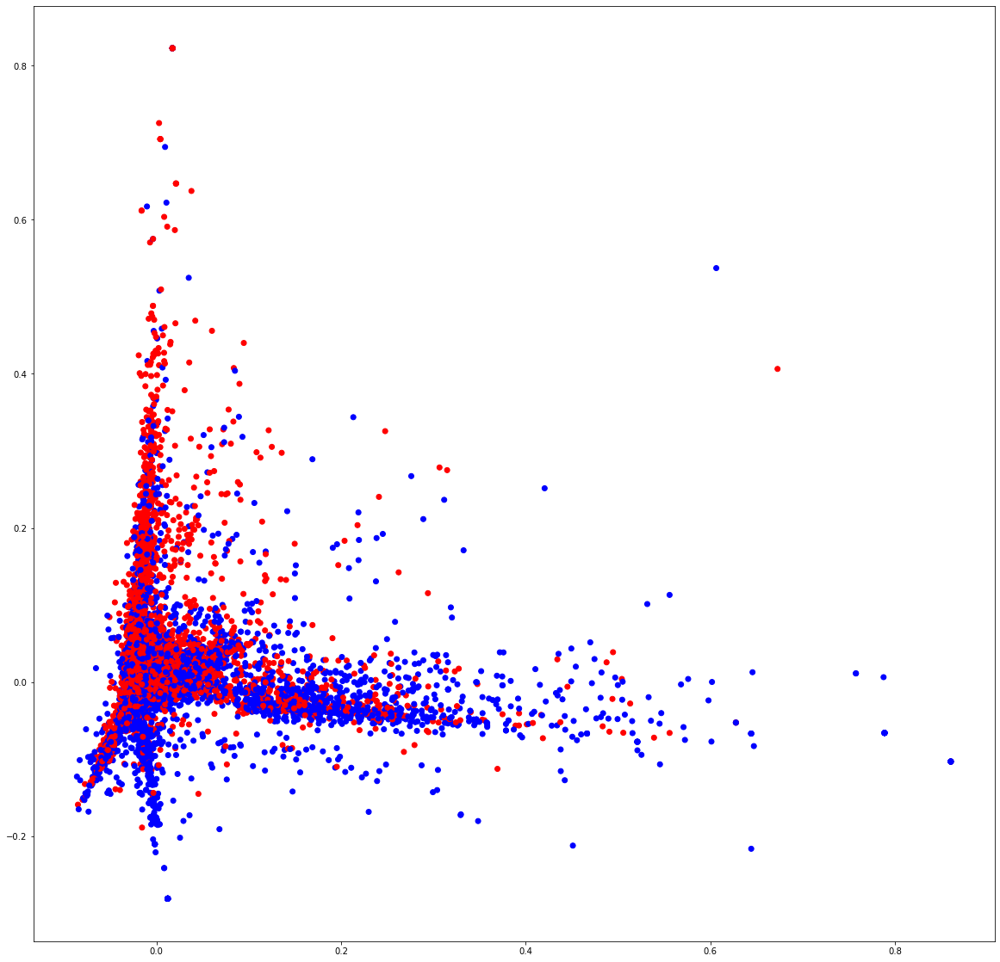

In [41]:

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).todense()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()

# Training

### CNN


In [42]:
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [43]:
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [44]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(64, 5, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Flatten()(x)
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)


model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [45]:
history = model.fit(X_train, y_train, batch_size=1024, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
1245/1245 [==============================] - 897s 721ms/step - loss: 0.5181 - accuracy: 0.7408 - val_loss: 0.5016 - val_accuracy: 0.7541
Epoch 2/10
1245/1245 [==============================] - 775s 623ms/step - loss: 0.4897 - accuracy: 0.7625 - val_loss: 0.4815 - val_accuracy: 0.7702
Epoch 3/10
1245/1245 [==============================] - 865s 695ms/step - loss: 0.4793 - accuracy: 0.7694 - val_loss: 0.4739 - val_accuracy: 0.7746
Epoch 4/10
1245/1245 [==============================] - 865s 694ms/step - loss: 0.4737 - accuracy: 0.7731 - val_loss: 0.4704 - val_accuracy: 0.7752
Epoch 5/10
1245/1245 [==============================] - 842s 676ms/step - loss: 0.4696 - accuracy: 0.7752 - val_loss: 0.4733 - val_accuracy: 0.7752
Epoch 6/10
1245/1245 [==============================] - 753s 605ms/step - loss: 0.4664 - accuracy: 0.7773 - val_loss: 0.4693 - val_accuracy: 0.7780
Epoch 7/10
1245/1245 [==============================] - 750s 603ms/step - loss: 0.4643 - accuracy: 0.7789 - val_

In [46]:
model.save('models/cnn_model.h5')

In [48]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow as tf

load_model = tf.keras.models.load_model('models/cnn_model.h5')

# Check its architecture
load_model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 30, 300)           87137400  
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 30, 300)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 26, 64)            96064     
_________________________________________________________________
dense (Dense)                (None, 26, 512)           33280     
_________________________________________________________________
dropout (Dropout)            (None, 26, 512)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 26, 512)          

Text(0.5, 0, 'epoch')

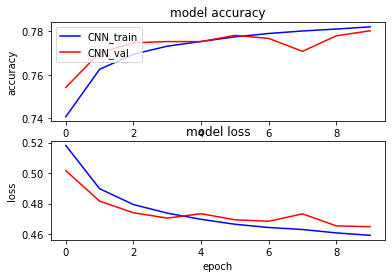

In [51]:
import matplotlib.pyplot as plt

plt1, (plt2, plt3) = plt.subplots(2,1)
plt2.plot(history.history['accuracy'], c= 'blue')
plt2.plot(history.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['CNN_train', 'CNN_val'], loc='upper left')

plt3.plot(history.history['loss'], c='blue')
plt3.plot(history.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')

In [52]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 44s 1s/step


#### Confusion Matrix

[[124059  35434]
 [ 34587 124386]]


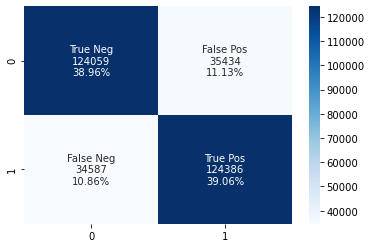

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

#Get the confusion matrix
cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
print(cf_matrix)


#sns.heatmap(cf_matrix, annot=True)
#sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')
labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
#sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

In [54]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.78      0.78      0.78    159493
    Positive       0.78      0.78      0.78    158973

    accuracy                           0.78    318466
   macro avg       0.78      0.78      0.78    318466
weighted avg       0.78      0.78      0.78    318466

